---
jupyter: python3
---

# Team 4 live submission --- advanced setup {#sec-team4-submission}

::: {.callout-note title="Learning objective"}
You can render `team_4`'s signed-off live submission: a 24-hour DE load
forecast produced by a richer feature/lag setup than the generic
baseline in @sec-live-submission.
The chapter writes the validated CSV into the leaderboard fork and
documents the exact `git` / `gh` commands `team_4` uses to open the
submission PR.
:::

## Overview {#sec-team4-overview}

@sec-live-submission is a *generic* template: any team can render it,
substitute a placeholder, and submit. This chapter is *team_4's tuned variant*. Every safety contract from chapter 13 carries over
(deadline check, 24-row schema, strictly-positive forecasts, fail-loud
ENTSO-E coverage assertion); only the modelling configuration changes.

What this chapter changes relative to @sec-live-submission:

- All five seasonal `Period`s instead of `daily` alone --- weekly,
  monthly, quarterly, and yearly RBF encodings join the daily one.
- Candidate lags chosen *dynamically* from the data --- the
  PACF-significant lags (@sec-team4-lags) rather than the baseline's
  hard-coded `[1, 2, 24]` --- and a curated SpotOptim lag pool
  (@sec-team4-search-space) in which every candidate carries the weekly
  anchor 167/168 and the extended candidates add cycle neighbours and
  the two-week lag.
- A chapter-specific forecaster factory (@sec-team4-factory): three
  anchored rolling window means (72 h/168 h/720 h) that pin the forecast
  to the observed load level, instead of the stock factory's single
  72-hour mean. The section also documents, as a worked incident, why a
  first version with an L1 objective and 24-hour windows flattened the
  live forecast.
- A training cutoff that only accepts a *complete* frontier hour
  (@sec-team4-cutoff): a partially published last hour can no longer
  anchor the recursion at an anomalous value.
- A value-sanity tripwire on the recent feed (@sec-team4-cutoff): complete
  but physically implausible 15-minute actuals --- as published by ENTSO-E
  on 2026-06-03/04, with intra-hour ranges up to 15 GW --- are cut away
  before they can poison the recursion anchor and the seasonal lags. The
  rules live in `spotforecast2-safe` (>= 16.4.0) and run inside
  `prepare_data` via `target_qc_*` / `target_corruption_policy`; this
  chapter's default is `truncate` (retract training to the last sound hour,
  bridge the gap on published day-ahead exog), with `abort` as the
  conservative alternative.
- A shape plausibility check before the submission is written
  (@sec-team4-shape-check): the forecast's daily profile is compared
  against ENTSO-E's day-ahead reference and a loud warning --- not an
  abort --- flags an implausible shape for the operator (Art. 14).
- `include_weather_windows=True`, `include_holiday_features=True`,
  `poly_features_degree=2` --- temperature, DE/NW public holidays,
  and bilinear calendar-by-weather interactions enter the exogenous
  matrix. The interactions are capped at `max_poly_features=40`, keeping
  only the forty most informative ones (by mutual information).
- `include_holiday_adjacency_features=True` (sf2-safe `>=` 15.9.0) ---
  three holiday-adjacency indicators join the holiday flag: the German
  *Brückentag* (a working day bridging a public holiday and the
  weekend) and the days immediately before and after a public holiday.
  All three mark days whose load profile sits between the regular
  weekday and the holiday level.
- Five new provider-based exogenous inputs (sf2-safe `>=` 15.7.0):
  ENTSO-E's day-ahead `Forecasted Load`, its day-ahead wind/solar
  generation forecast, the derived net load, the DE/LU day-ahead spot
  price, and a bundled German COVID-19 7-day incidence series. Every one is
  either a day-ahead value (published `D-1`) or a static published vintage,
  so all are admissible at forecast time without leaking the target day
  (CR-3). This is the key modelling change from the earlier draft of this
  chapter, where the day-ahead `Forecasted Load` was held out as a baseline
  rather than used as a feature.
- A deeper SpotOptim search --- 100 / 50 (trials / initial evaluations) with
  `number_folds=10` --- kept affordable for a live render by tuning in parallel
  across all CPU cores (`n_jobs_spotoptim=-1`). Lower the trial budget for a
  faster render, or set `n_jobs_spotoptim=None` for a fully deterministic one
  (@sec-team4-config).
- A two-year training window (`TRAIN_SIZE`) instead of three: the window
  still spans two full seasonal cycles but stays clear of the 2022/23
  energy-crisis demand regime, which no longer resembles current load.

## Submission contract

Unchanged --- see @sec-live-contract for the CSV schema, deadline, and
scoring rules. The leaderboard validator that runs against this
chapter's output is byte-identical to the one used by
@sec-live-submission.

## Team identity {#sec-team4-identity}

This chapter competes under one of two registered identities, and the choice
is not made by editing a placeholder --- it is *derived from the model
configuration*. With `include_entsoe_forecast_load=True` (@sec-team4-config)
the model consumes ENTSO-E's own day-ahead `Forecasted Load` as a feature, a
near-oracle prior; a forecast built on that prior is a different class of
submission than one built without it, so it runs under the id
`team_4_entsoe`. Setting the flag to `False` removes the prior and the same
pipeline submits as plain `team_4`. The submission cell at @sec-team4-write
reads the flag off `team4_config` and selects the id automatically, so model
class and leaderboard identity can never drift apart. The cell below
confirms that both candidate identities are registered in
`challenge-leaderboard/teams.yml`.

In [1]:
#| label: team4-registry
#| echo: true
from pathlib import Path
import yaml

teams_yml = Path(r"D:\workspace\challenge-leaderboard") / "teams.yml"
teams = yaml.safe_load(teams_yml.read_text())["teams"]
for tid in ("a_team", "a_team_entsoe"):
    team = next((t for t in teams if t["id"] == tid), None)
    assert team is not None, f"{tid} is not in challenge-leaderboard/teams.yml"
    print(f"{tid:<14} display_name: {team['display_name']:<24} "
          f"github: {', '.join(team['github_handles'])}")

a_team         display_name: Das A Team               github: obecher, Math1s0, JannhTH, MarkDT551, Kradid655
a_team_entsoe  display_name: Das A Team (ENTSO-E)     github: obecher, Math1s0, JannhTH, MarkDT551, Kradid655


`validate_authorship()` in
`scripts/validate_submission.py:89` rejects PRs whose author is not in
this `github_handles` list, so the `gh auth login` account used in
@sec-team4-push must match.

## Prerequisites and walkthrough

Identical to @sec-live-walkthrough: Python 3.13 + uv, a personal
ENTSO-E API key exported as `ENTSOE_API_KEY`, `gh auth login` as a
registered `team_4` handle, and a sibling clone of
`challenge-leaderboard` at `~/workspace/challenge-leaderboard/`.

One version requirement is new to this advanced setup. The provider-based
exogenous inputs (@sec-team4-config) need `spotforecast2-safe >= 15.7.0`: the
`include_entsoe_*` / `include_covid_infection_rate` flags are `ConfigEntsoe`
constructor arguments and the `download_renewable_forecast` /
`download_day_ahead_price` helpers are new in that release, so an older install
raises rather than runs --- this is a hard floor, not an optional add-on. They
also need a `spotforecast2` build whose `build_exogenous_features` wires the
provider registry into the live `MultiTask` pipeline; with a new
`spotforecast2-safe` but an old `spotforecast2` the config still constructs and
the side-tables still download, but the flags are inert (the pipeline never
appends the provider columns) and the model falls back to the weather, holiday,
and calendar feature set.

The only difference from the generic walkthrough is that there is no team-id
placeholder to edit: the submission cell at @sec-team4-write derives
`TEAM_ID` from the configuration (`team_4_entsoe` when ENTSO-E's day-ahead
forecast is a model feature, `team_4` when it is not; @sec-team4-identity).

## Live pipeline {#sec-team4-example}

The cells below are the *live* team_4 pipeline. Every render
downloads today's ENTSO-E actuals, tunes an LGBM forecaster with the
advanced configuration, and writes a validated CSV for tomorrow.

In [2]:
#| label: team4-imports
#| echo: true
import logging, os
from pathlib import Path
import pandas as pd

# Parallel SpotOptim tuning (`n_jobs_spotoptim`, @sec-team4-config) runs the
# surrogate search across CPU cores via a process pool. Under a Jupyter kernel
# --- which is how Quarto executes this chapter --- the platform-default
# "spawn" start method cannot re-import the notebook's __main__, so every
# worker evaluation fails ("All initial design evaluations failed"). Switching
# to "fork" (the Linux default; also available on macOS) lets workers inherit
# the already-imported modules and the objective, so the pool works at render
# time. This call must run before any pool is created. It is harmless where
# "fork" is already the default; on a platform without "fork" the guard falls
# through and you should set `n_jobs_spotoptim=None` (sequential) instead.
import multiprocessing as _mp
os.environ.setdefault("OBJC_DISABLE_INITIALIZE_FORK_SAFETY", "YES")
try:
    _mp.set_start_method("fork", force=True)
except (RuntimeError, ValueError):
    pass

logging.basicConfig(level=logging.WARNING)

# Isolate this chapter's storage from chapter 13 -----------------------------
# download_new_data() writes the merged ENTSO-E mirror to
# <SPOTFORECAST2_DATA>/interim/energy_load.csv, and MultiTask persists tuned
# models, tuning results, and logs under <SPOTFORECAST2_CACHE>. Both default to
# a single shared location in $HOME, so chapters 13 and 14 would otherwise read
# and write the *same* interim download. Pinning per-chapter homes here — before
# any download or MultiTask call — gives this chapter its own download, cache,
# and log directory. The package reads both env vars at call time via
# get_data_home() / get_cache_home(), so setting them now is sufficient.
os.environ["SPOTFORECAST2_DATA"]  = str(Path(r"D:\spotforecast2_data\ddmo_ch14_team4"))
os.environ["SPOTFORECAST2_CACHE"] = str(Path(r"D:\spotforecast2_cache\ddmo_ch14_team4"))

from lightgbm import LGBMRegressor
from spotforecast2_safe.data import Period
from spotforecast2_safe.downloader.entsoe import (
    download_new_data,
    download_renewable_forecast,
    download_day_ahead_price,
)
from spotforecast2_safe.data.fetch_data import get_data_home
from spotforecast2_safe.configurator.config_entsoe import ConfigEntsoe
from spotforecast2_safe.forecaster.recursive import ForecasterRecursive
from spotforecast2_safe.preprocessing import RollingFeatures
from spotforecast2.tasks.task_entsoe import (
    entsoe_data_loader,
    entsoe_test_data_loader,
)
from spotforecast2.multitask import MultiTask

### Dynamic date constants

Every date is derived from `pd.Timestamp.now(tz="UTC").normalize()` so
the chapter stays correct on every render --- same convention as
@sec-live-example.

In [3]:
#| label: team4-constants
#| echo: true
NOW_UTC = pd.Timestamp.now(tz="UTC")
TODAY_UTC = NOW_UTC.normalize()
YESTERDAY_UTC = TODAY_UTC - pd.Timedelta(days=1)
TOMORROW_UTC = TODAY_UTC + pd.Timedelta(days=1)

# The earliest available timestamp: 2014-12-31 23:00 UTC
# START_DOWNLOAD = "201501010000"
START_DOWNLOAD = "202201010000"
# Fetch through *tomorrow* so the interim file lands two things: (a) the most
# current ENTSO-E actuals already published today --- which shrinks the
# recursive bridge and horizon --- and (b) ENTSO-E's own day-ahead
# `Forecasted Load` for the target day, fed to the model as the
# `entsoe_forecasted_load` feature (@sec-team4-exog) and also drawn in the
# comparison plot in @sec-team4-vs-entsoe. Future timestamps simply
# carry no Actual Load yet, so the training cutoff and horizon are unchanged.
END_DOWNLOAD = (TOMORROW_UTC + pd.Timedelta(days=1)).strftime("%Y%m%d%H%M")

print(f"NOW_UTC       = {NOW_UTC}")
print(f"TODAY_UTC     = {TODAY_UTC}")
print(f"TOMORROW_UTC  = {TOMORROW_UTC}  (target day = y_0)")
print(f"END_DOWNLOAD  = {END_DOWNLOAD}  (covers tomorrow for ENTSO-E's day-ahead forecast)")

NOW_UTC       = 2026-06-21 16:13:12.176634+00:00
TODAY_UTC     = 2026-06-21 00:00:00+00:00
TOMORROW_UTC  = 2026-06-22 00:00:00+00:00  (target day = y_0)
END_DOWNLOAD  = 202606230000  (covers tomorrow for ENTSO-E's day-ahead forecast)


### Download today's ENTSO-E actuals and ENTSO-E's own day-ahead `Forecasted Load` {#sec-team4-download}

In [4]:
#| label: team4-download
#| echo: true

import os
os.environ["ENTSOE_API_KEY"] = "e4c97956-b05f-4bc9-af46-6677f2790552"

from spotforecast2_safe.downloader.entsoe import download_new_data
api_key = os.environ.get("ENTSOE_API_KEY")
assert api_key, "ENTSOE_API_KEY must be set in the environment."

download_new_data(
    api_key=api_key,
    country_code="DE",
    start=START_DOWNLOAD,
    end=END_DOWNLOAD,
    force=True,  # bypass the 24 h cooldown so every render pulls a fresh mirror
    keep_forecast_future=True,
    timeout=60,  # bound stalled reads: a dead socket once hung a render forever
)

`keep_forecast_future=True` is the one argument that differs from the training
chapters' download. By default `download_new_data` drops every row after `now`
when it builds the interim file --- the leakage-free input a model must train
on. That default would also erase ENTSO-E's day-ahead `Forecasted Load` for the
target day, leaving the baseline comparison in @sec-team4-vs-entsoe with nothing
to plot. The flag keeps those future rows, so tomorrow's published forecast
survives; the future `Actual Load` is still blank, so no future target leaks
into training (the leakage guard in @sec-team4-importance re-checks this).
`timeout=60` (sf2-safe ≥ 16.2.0, also the package default) bounds every
read on the connection: a stalled socket now raises after a minute and is
retried, instead of hanging the render indefinitely --- which a dead
ENTSO-E connection once did to this very chapter. All three download cells
in this chapter pass it explicitly.

### The interim energy-load frame {#sec-team4-interim}

`download_new_data` merges every ENTSO-E pull into one tidy file,
`interim/energy_load.csv`, under the package data home (`get_data_home()`).
That file is the single source the rest of the chapter reads from. Its shape
is worth knowing before the cells below slice it:

- Index --- `Time (UTC)` parsed to a timezone-aware `DatetimeIndex`, stepping
  in 15-minute (quarter-hour) increments. It runs from `START_DOWNLOAD`
  (`2022-01-01 00:00 UTC`) through `END_DOWNLOAD` (the day after tomorrow),
  so the frame deliberately extends past *now* into the target day.
- `Actual Load` --- ENTSO-E's German *Actual Total Load* in MW, the
  forecaster's target. It is populated only up to the last quarter-hour
  ENTSO-E has actually published; every timestamp after that --- including
  all of the target day --- is blank (`NaN`). The last non-blank stamp is
  what @sec-team4-cutoff turns into `end_train`.
- `Forecasted Load` --- ENTSO-E's own day-ahead load forecast in MW,
  published around midday `D-1`. Because it is a forecast, it covers the
  future hours `Actual Load` does not, which is exactly why
  `END_DOWNLOAD` reaches into tomorrow. team_4 now uses this day-ahead
  column as the `entsoe_forecasted_load` feature (@sec-team4-exog) --- it is
  published `D-1`, so it is leakage-clean (CR-3) --- and also draws it as the
  comparison baseline in @sec-team4-vs-entsoe and the overlay in
  @fig-team4-training-data-visualization-last-week.
- `Actual` --- a legacy ENTSO-E column carried through the download
  verbatim; it is empty for DE load and the pipeline ignores it.

The cell below loads the file, coerces the index to UTC, and runs three
fail-loud coverage checks. The first guards the frame's *index*: it must
reach at least `D-1 23:00 UTC` so the exogenous features and the forecast
bridge have somewhere to land. That index is kept fresh by `Forecasted Load`
(which extends into the future), so it does *not* speak to the target's
freshness. The second check therefore guards the target directly. It cannot
demand the actuals reach `D-1 23:00`, because ENTSO-E publishes the German
actual load with a normal lag of a few hours --- early in the UTC day the
actuals legitimately trail that bar. Instead it allows the last *published*
`Actual Load` stamp to lag `now` by up to `MAX_ACTUAL_LAG` (24 h here, easily
raised), failing only when the feed is genuinely stale --- the index looking
current while the training history quietly ended a day or more early.

Both of those checks guard the *edges* of the feed; neither can see a hole in
its middle. Yet exactly such a hole appeared on 2026-06-02, when ENTSO-E
published a full day of German actuals more than a day late: the index stayed
fresh, the last actual stayed recent, and an entire day of `NaN` slipped
between them. Left undetected, the imputation would bridge the hole with
interpolated values and quietly distort the lag features the model trains on.
The third check therefore scans the recent window the lag features depend on
(`GAP_SCAN_DAYS`) and fails when two consecutive *published* actuals are
further apart than `MAX_ACTUAL_GAP`.

In [5]:
interim_csv = get_data_home() / "interim" / "energy_load.csv"
interim = pd.read_csv(interim_csv, index_col=0, parse_dates=True)
interim.index = pd.to_datetime(interim.index, utc=True)

required_last = TODAY_UTC - pd.Timedelta(hours=1)
if interim.index.max() < required_last:
    raise RuntimeError(
        f"ENTSO-E coverage is stale: last interim row is {interim.index.max()} "
        f"but the chapter requires at least {required_last}. "
        "Re-run download_new_data(..., force=True) or check the ENTSO-E API."
    )

# ENTSO-E publishes the German actual load with a normal lag of a few hours,
# so the actuals legitimately trail `now` (especially early in the UTC day).
# Guard only against a genuinely stale feed: the last published actual must lie
# within MAX_ACTUAL_LAG of now. Raise the tolerance if your feed lags more.
MAX_ACTUAL_LAG = pd.Timedelta(hours=36)
last_actual = interim["Actual Load"].dropna().index.max()
if last_actual < NOW_UTC - MAX_ACTUAL_LAG:
    lag_h = int((NOW_UTC - last_actual) / pd.Timedelta(hours=1))
    raise RuntimeError(
        f"Actual Load is stale: last published actual is {last_actual}, "
        f"{lag_h} h before now ({NOW_UTC}); tolerance is "
        f"{int(MAX_ACTUAL_LAG / pd.Timedelta(hours=1))} h. "
        "Re-run download_new_data(..., force=True) or wait for ENTSO-E to "
        "publish more recent actuals."
    )

# The two edge checks above cannot see a hole in the middle of the feed: the
# index stays fresh (Forecasted Load) and the last actual stays recent even
# when a publication outage wiped out a full day in between (observed
# 2026-06-02). Scan the recent window the lag features depend on and fail
# loudly on any oversized interior gap between consecutive published actuals.
GAP_SCAN_DAYS = 28
MAX_ACTUAL_GAP = pd.Timedelta(hours=12)
recent_actuals = (
    interim["Actual Load"]
    .loc[NOW_UTC - pd.Timedelta(days=GAP_SCAN_DAYS):]
    .dropna()
)
actual_gaps = recent_actuals.index.to_series().diff()
oversized = actual_gaps[actual_gaps > MAX_ACTUAL_GAP]
if not oversized.empty:
    gap_list = ", ".join(
        f"{end - width} → {end} ({width})" for end, width in oversized.items()
    )
    raise RuntimeError(
        f"Actual Load has interior gaps wider than {MAX_ACTUAL_GAP} within "
        f"the last {GAP_SCAN_DAYS} days: {gap_list}. ENTSO-E may have "
        "published late; re-run download_new_data(..., force=True) once the "
        "late actuals are published, and make sure no stale partial pull in raw/ "
        "is masking them (current spotforecast2-safe merges raw pulls "
        "NaN-safely: the newest non-missing value wins)."
    )
print(f"interim CSV last row: {interim.index.max()}")
print(interim["Actual Load"].dropna().tail(6))

interim CSV last row: 2026-06-22 21:45:00+00:00
Time (UTC)
2026-06-21 14:00:00+00:00    41478.45851
2026-06-21 14:15:00+00:00    42406.15722
2026-06-21 14:30:00+00:00    42852.84536
2026-06-21 14:45:00+00:00    43177.06236
2026-06-21 15:00:00+00:00    44469.98240
2026-06-21 15:15:00+00:00    44819.84829
Name: Actual Load, dtype: float64


### Extract ENTSO-E's day-ahead `Forecasted Load` {#sec-team4-entsoe-predictions}

ENTSO-E's own day-ahead forecast is used twice downstream --- as the overlay
in @fig-team4-training-data-visualization and as the scored baseline in
@sec-team4-vs-entsoe --- so we pull it out of the `interim` frame once, here,
and keep it as a standalone Series. It is resampled onto the hourly grid (the
mean of each hour's four quarter-hour values, matching how `prepare_data()`
aggregates the actuals in @sec-team4-prepare), so it lines up directly with the
forecaster's hourly output for error computations. The trailing `.dropna()`
keeps only the hours ENTSO-E has actually published a forecast for. team_4 now
uses these day-ahead values as the `entsoe_forecasted_load` feature
(@sec-team4-exog); `predictions_entsoe` is the same series, kept here for the
comparison baseline in @sec-team4-vs-entsoe.

In [6]:
#| label: team4-entsoe-predictions
#| echo: true
predictions_entsoe = interim["Forecasted Load"].resample("h").mean().dropna()
predictions_entsoe.name = "Forecasted Load"

print(f"predictions_entsoe: {len(predictions_entsoe)} hourly values "
      f"| {predictions_entsoe.index.min()} → {predictions_entsoe.index.max()}")
print(predictions_entsoe.tail(6))

predictions_entsoe: 39214 hourly values | 2022-01-01 00:00:00+00:00 → 2026-06-22 21:00:00+00:00
Time (UTC)
2026-06-22 16:00:00+00:00    58617.734156
2026-06-22 17:00:00+00:00    58728.639032
2026-06-22 18:00:00+00:00    57289.310469
2026-06-22 19:00:00+00:00    55365.500150
2026-06-22 20:00:00+00:00    52733.846541
2026-06-22 21:00:00+00:00    49581.376384
Freq: h, Name: Forecasted Load, dtype: float64


### Native resolution: 15-minute actuals aggregated to hourly

ENTSO-E publishes the German *Actual Total Load* at 15-minute (quarter-hour)
resolution, and `download_new_data` stores it verbatim --- the
`interim/energy_load.csv` index steps in 15-minute increments, not hourly. The
hourly grid the forecaster trains on is produced later, inside `prepare_data()`
(@sec-team4-prepare): it calls `agg_and_resample_data(rule="h", by="mean")`
(in `spotforecast2_safe.preprocessing.curate_data`), which replaces the four
quarter-hour values in each hour with their mean. The mean --- not the sum ---
is the correct aggregation because load is an average power level over the
interval, not an accumulated quantity. The cell below confirms the native
cadence of the freshly downloaded `interim` frame.

In [7]:
#| label: team4-native-resolution
#| echo: true
native_step = interim.index.to_series().diff().dropna().mode().iloc[0]
print(f"interim rows           : {len(interim)}")
print(f"native cadence (modal) : {native_step}   <- 15-min ENTSO-E DE Actual Load")
print(interim[["Actual Load"]].dropna().head(4))

interim rows           : 156852
native cadence (modal) : 0 days 00:15:00   <- 15-min ENTSO-E DE Actual Load
                           Actual Load
Time (UTC)                            
2022-01-01 00:00:00+00:00     42195.81
2022-01-01 00:15:00+00:00     41803.94
2022-01-01 00:30:00+00:00     41140.73
2022-01-01 00:45:00+00:00     41002.15


### The renewable forecast data

In [8]:
# New day-ahead exogenous side-tables (sf2-safe >= 15.7.0). Each writes its own
# namespaced interim file (interim/renewable_forecast.csv, interim/day_ahead_price.csv);
# the `Actual Load` / `Forecasted Load` schema in interim/energy_load.csv is untouched.
# These feed the ENTSO-E renewable/net-load/price providers enabled in @sec-team4-config.
# They are day-ahead values (published D-1), so they are leakage-clean at forecast time.

from spotforecast2_safe.downloader.entsoe import download_renewable_forecast
download_renewable_forecast(
    api_key=api_key, country_code="DE", start=START_DOWNLOAD, end=END_DOWNLOAD, force=True,
    timeout=60,
)

After the renewable forecast data were downloaded, the following data are
available. `download_renewable_forecast` merges every pull into its own
interim file, `interim/renewable_forecast.csv`, under the chapter's data home
(`get_data_home()`), currently about 19 MB on disk. The frame carries three
features, each an ENTSO-E day-ahead generation forecast for Germany in MW:
`Solar`, `Wind Offshore`, and `Wind Onshore`. Its `Time (UTC)` index steps in
15-minute (quarter-hour) increments and runs from `START_DOWNLOAD`
(`2015-01-01 00:00 UTC`) through the end of the target day --- roughly
400,000 rows --- because tomorrow's forecast is already published on `D-1`.
That publication schedule is also what makes the columns leakage-clean
(CR-3): the file contains only forecasts, never the realised generation.
Downstream, the `EntsoeRenewableForecastProvider` enabled in
@sec-team4-config aggregates the wind columns into `entsoe_wind_forecast`
and the solar column into `entsoe_solar_forecast`. The cell below confirms
shape and coverage on today's render:

In [9]:
#| label: team4-renewable-inspect
#| echo: true
renewable_csv = get_data_home() / "interim" / "renewable_forecast.csv"
renewable = pd.read_csv(renewable_csv, index_col=0, parse_dates=True)
renewable.index = pd.to_datetime(renewable.index, utc=True)
print(f"features : {list(renewable.columns)}")
print(f"rows     : {len(renewable):,} (freq {pd.infer_freq(renewable.index[:100])})")
print(f"begin    : {renewable.index.min()}")
print(f"end      : {renewable.index.max()}  (covers the target day y_0)")
print(f"gaps     : {renewable.isna().sum().to_dict()}")

features : ['Solar', 'Wind Offshore', 'Wind Onshore']
rows     : 156,852 (freq 15min)
begin    : 2022-01-01 00:00:00+00:00
end      : 2026-06-22 21:45:00+00:00  (covers the target day y_0)
gaps     : {'Solar': 0, 'Wind Offshore': 0, 'Wind Onshore': 0}


### The Day-Ahead Price Data


In [10]:
from spotforecast2_safe.downloader.entsoe import download_day_ahead_price
download_day_ahead_price(
    api_key=api_key, country_code="DE_LU", start=START_DOWNLOAD, end=END_DOWNLOAD, force=True,
    timeout=60,
)

After the day-ahead price data were downloaded, the following data are
available. `download_day_ahead_price` writes the second side-table,
`interim/day_ahead_price.csv` (currently about 2.7 MB and roughly 85,000
rows), holding a single feature: the `Day-ahead Price` of the DE_LU bidding
zone in EUR/MWh, the clearing price of the day-ahead auction. Its
`Time (UTC)` index begins on `2018-09-30 22:00 UTC` rather than at
`START_DOWNLOAD`: the DE_LU zone only came into existence with the
German--Austrian bidding-zone split on 1 October 2018, so ENTSO-E has no
earlier prices to deliver. The index also changes resolution mid-file ---
hourly up to the European single day-ahead coupling's switch to 15-minute
products on 1 October 2025, quarter-hourly since --- and runs through the
end of the target day, because the auction for delivery day `D` clears
around noon on `D-1`. That makes the column leakage-clean (CR-3) just like
the renewable forecast; the `EntsoeDayAheadPriceProvider` enabled in
@sec-team4-config exposes it as the `entsoe_day_ahead_price` feature. The
cell below confirms shape and coverage on today's render:

In [11]:
#| label: team4-price-inspect
#| echo: true
price_csv = get_data_home() / "interim" / "day_ahead_price.csv"
price = pd.read_csv(price_csv, index_col=0, parse_dates=True)
price.index = pd.to_datetime(price.index, utc=True)
print(f"features : {list(price.columns)}")
print(f"rows     : {len(price):,} (freq {pd.infer_freq(price.index[:100])} -> {pd.infer_freq(price.index[-100:])})")
print(f"begin    : {price.index.min()}")
print(f"end      : {price.index.max()}  (covers the target day y_0)")
print(f"gaps     : {price.isna().sum().to_dict()}")

features : ['Day-ahead Price']
rows     : 58,294 (freq h -> 15min)
begin    : 2022-01-01 00:00:00+00:00
end      : 2026-06-22 21:45:00+00:00  (covers the target day y_0)
gaps     : {'Day-ahead Price': 0}


## Training cutoff and forecast horizon {#sec-team4-cutoff}

Almost identical mechanics to @sec-live-example: anchor `end_train` at the
last full hour of `Actual Load`, then forecast forward through
tomorrow 23:00 UTC and slice the 24 rows we submit. One refinement is new:
"last full hour" is now taken literally. ENTSO-E publishes the German actuals
in 15-minute resolution, and the frontier hour of the feed is often only
partially published --- one to three of its four quarter-hour values. The
naive cutoff `dropna().index.max().floor("h")` accepts such an hour, and
`prepare_data()` then averages whatever quarter-hours exist. That partial mean
can sit far off the true hourly level, and because it becomes the recursive
forecaster's lag-1 anchor, a single bad frontier value drags the entire first
forecast day with it --- exactly the "starts low, catches up" underestimation
observed on the 2026-06-05 forecast. The guard below therefore accepts only
hours whose full complement of quarter-hour samples has been published,
stepping `end_train` back by at most one hour.

Completeness alone is not sufficient, however. On 2026-06-03/04 ENTSO-E
published quarter-hour actuals that were *complete but physically impossible*
--- adjacent 15-minute slots oscillating by ±10 GW, intra-hour ranges up to
15 GW, identical in every raw download vintage, so demonstrably a source-side
publication artefact rather than a transfer problem. Values like these pass
every staleness and completeness check, enter the recursion anchor and the
seasonal lags (24 h, 48 h, 168 h), and quietly degrade a week of forecasts.
The second guard below therefore checks the *plausibility* of the recent feed:
on clean German data the 99.99th percentile of the intra-hour 15-minute range
is about 7.3 GW and of the adjacent-slot step about 4.1 GW, so thresholds of
8 GW and 6 GW separate publication artefacts from real load dynamics with no
false positives outside the late-March DST transition week.

Two findings from the incident forensics shape what happens when the guard
trips. First, waiting is not a strategy. ENTSO-E publishes Actual Total Load
(Art. 6.1.a of Regulation (EU) 543/2013) at H+1 as raw operational metering
and applies at most minor metering-precision restatements; it does not
retroactively correct gross dropouts of this class --- the only historical
analog, 2016-01-11, remains uncorrected in the live API a decade later, and
the 2026-06 corrupt values are returned byte-identically on re-query.
Corruption ages out of the QC window; it does not get backfilled. Second,
the rules now live in `spotforecast2-safe` itself
(`detect_target_corruption`, since 16.4.0), together with a config knob
`target_corruption_policy` offering three responses: `abort` (the library
default and the strictest Art. 14 posture: halt and hand the decision to a
human), `heal` (interpolate *interior* corruption with zero training
weights, refused inside the one-week anchor zone --- which is why it never
engages on frontier corruption like this incident), and `truncate` (retract
training to the last sound hour and extend the forecast horizon, so the
recursion bridges a longer gap on *published* day-ahead exogenous data,
fabricating nothing). On the frozen incident data the truncate policy
recovers a phase-correct forecast (r ≈ 0.97 at cross-correlation lag 0,
horizon auto-extended 38 → 84 steps) where the unguarded run was rolled by
+9 h; the full heal-versus-truncate comparison is the Gate B study in
`diagnosis/outlier-weighting-analysis.md`.

Because aborting buys no better data later, this chapter runs
`policy="truncate"` as its default since 2026-06-05: the submission proceeds
on sound published history, the retraction is WARNING-logged inside
`prepare_data` (Art. 12 record-keeping), and human oversight moves to the
shape plausibility check before the submission is written
(@sec-team4-shape-check, Art. 14). The cell below previews the policy
decision on the downloaded frame; the authoritative run happens inside
`prepare_data` via the `target_qc_*` knobs of @sec-team4-config, so the
guard holds even when this notebook cell is skipped. Operators preferring
the strict posture flip one constant back to `"abort"`.

In [12]:
#| label: team4-cutoff
#| echo: true
LAST_TARGET = TOMORROW_UTC + pd.Timedelta(hours=23)

# Frontier completeness guard: only an hour with all of its quarter-hour
# samples published may anchor the recursion. The expected count per hour is
# derived from the feed's own cadence (15 min for DE -> 4 samples/hour), so
# the guard also works unchanged on an hourly-cadence feed (1 sample/hour).
actual_15min = interim["Actual Load"].dropna()
CADENCE = actual_15min.index.to_series().diff().mode().iloc[0]
SAMPLES_PER_HOUR = int(pd.Timedelta(hours=1) / CADENCE)
samples_by_hour = actual_15min.resample("h").count()
LAST_FULL_HOUR = samples_by_hour[samples_by_hour >= SAMPLES_PER_HOUR].index.max()

FIRST_PRED = LAST_FULL_HOUR + pd.Timedelta(hours=1)
LIVE_N_STEPS = int((LAST_TARGET - FIRST_PRED).total_seconds() // 3600) + 1

# Value-sanity tripwire (2026-06-03/04 incident): complete but physically
# impossible 15-min actuals must not anchor the recursion. Thresholds are the
# clean-data q0.9999 rounded up (intra-hour range 7.3 -> 8 GW, adjacent step
# 4.1 -> 6 GW); the late-March DST transition week can reach ~12.6 GW ranges
# and would need a temporary exemption. Since sf2-safe 16.4.0 the rules live
# in the library and the SAME rules re-check the frame inside prepare_data
# via the target_qc_* knobs (@sec-team4-config) — one implementation, one
# mental model. This chapter runs policy="truncate" (default since
# 2026-06-05): training retracts to the last sound hour and the recursion
# bridges the gap on published day-ahead exog, fabricating nothing. Gate A
# of the incident forensics showed that aborting buys no better data later
# (ENTSO-E never corrects this class); "abort" stays available as the
# conservative alternative — flip the constant below.
from spotforecast2_safe.preprocessing import apply_target_corruption_policy

MAX_INTRAHOUR_RANGE_MW = 8_000
MAX_ADJ_STEP_MW = 6_000
QC_WINDOW_DAYS = 3
TARGET_CORRUPTION_POLICY = "truncate"   # "abort" = conservative alternative

# Diagnostics use the un-dropped series so that diffs across publication
# gaps show as NaN, matching the library's time-adjacency semantics.
qc_recent = interim["Actual Load"].loc[
    actual_15min.index.max() - pd.Timedelta(days=QC_WINDOW_DAYS) :
]
qc_hourly = qc_recent.resample("h")
qc_range = (qc_hourly.max() - qc_hourly.min()).dropna()
qc_step = qc_recent.diff().abs().dropna()

print(f"QC window            : last {QC_WINDOW_DAYS} days of 15-min actuals")
print(f"intra-hour range     : max {qc_range.max():,.0f} MW (limit {MAX_INTRAHOUR_RANGE_MW:,} MW)")
print(f"adjacent-slot step   : max {qc_step.max():,.0f} MW (limit {MAX_ADJ_STEP_MW:,} MW)")

# Preview on a copy — the AUTHORITATIVE policy run happens inside
# prepare_data via the target_qc_* knobs (@sec-team4-config). Under "abort"
# this call raises TargetCorruptionError; under "truncate" it reports what
# prepare_data will cut (WARNING-logged there, Art. 12 record-keeping).
_, qc_report = apply_target_corruption_policy(
    interim[["Actual Load"]],
    targets=["Actual Load"],
    policy=TARGET_CORRUPTION_POLICY,
    range_mw=MAX_INTRAHOUR_RANGE_MW,
    step_mw=MAX_ADJ_STEP_MW,
    window_days=QC_WINDOW_DAYS,
    max_heal_hours=0,
    anchor_zone_hours=168,
    cutoff=None,
    logger=logging.getLogger("team4-qc"),
)
if qc_report.fired:
    LAST_SOUND_HOUR = qc_report.first_flagged_hour - pd.Timedelta(hours=1)
    print(f"value-sanity QC      : {qc_report.n_flagged_hours} corrupt hour(s) in "
          f"{len(qc_report.spans)} span(s) -> policy {qc_report.action!r}")
    print(f"last sound hour      : {LAST_SOUND_HOUR}  (prepare_data retracts "
          f"data_end here and auto-extends predict_size to reach {LAST_TARGET})")
else:
    print(f"value-sanity QC      : PASS (no corruption in the last "
          f"{QC_WINDOW_DAYS} days)")

print(f"feed cadence         : {CADENCE}  ({SAMPLES_PER_HOUR} samples/hour)")
print(f"last published sample: {actual_15min.index.max()}")
print(f"end_train (inclusive): {LAST_FULL_HOUR}  (last complete hour)")
print(f"first forecast step  : {FIRST_PRED}")
print(f"last forecast step   : {LAST_TARGET}")
print(f"predict_size         : {LIVE_N_STEPS}  (slice last 24 for y_0)")

QC window            : last 3 days of 15-min actuals
intra-hour range     : max 4,727 MW (limit 8,000 MW)
adjacent-slot step   : max 3,842 MW (limit 6,000 MW)
value-sanity QC      : PASS (no corruption in the last 3 days)
feed cadence         : 0 days 00:15:00  (4 samples/hour)
last published sample: 2026-06-21 15:15:00+00:00
end_train (inclusive): 2026-06-21 14:00:00+00:00  (last complete hour)
first forecast step  : 2026-06-21 15:00:00+00:00
last forecast step   : 2026-06-22 23:00:00+00:00
predict_size         : 33  (slice last 24 for y_0)


### Data availability vs. the requested interval {#sec-team4-availability}

It is tempting to assume that at render time `now`, the `Actual Load` series
reaches `now - 1 h` --- the last completed hour. ENTSO-E does not work that
way: the German actual total load is published with a lag, so the last
*observed* hour `y_e` can sit well before `now - 1 h`. The span between them is
publication lag, not missing data, and `y_e` is exactly the `end_train` cutoff
fixed in @sec-team4-cutoff --- the last *complete* hour, which can trail the
newest published quarter-hour sample by one more hour whenever the frontier
hour is only partially published.

This matters because of how the frame is built. `download_new_data` extends the
merged index into the future via `Forecasted Load`, so `interim` runs to roughly
`now`, while `Actual Load` stops at `y_e`. When `prepare_data()`
(@sec-team4-prepare) resamples to an hourly grid it spans that full index, so the
hours after `y_e` carry no target and show up as `NaN`. They are *not* gaps in
the historical record --- they are the recent tail ENTSO-E has not published yet,
the very interval the forecast bridge is built to span. The curation and
imputation steps (@sec-team4-outliers, @sec-team4-impute) will encounter them,
but they are harmless: `end_train` slices them out of the training target
`y_train`, so the model never fits them.

The table below makes these boundaries explicit so the trailing `NaN` count seen
later is not mistaken for corrupt history. (The symbol `y_e` here marks a
data-availability boundary --- the last complete actual hour --- and is distinct
from the forecast notation `y_0` / `y_{-1}`, which name the target day and the
day before it.)

In [13]:
#| label: tbl-team4-availability
#| echo: true
#| tbl-cap: "Data availability vs. the requested interval. The last complete actual hour `y_e` (= `end_train`) lags the naive `now - 1 h`; the hours between `y_e` and the merged-frame index max carry no target and appear as trailing `NaN`, not as interior gaps."
from IPython.display import Markdown

naive_last = NOW_UTC.floor("h") - pd.Timedelta(hours=1)
last_actual_qh = interim["Actual Load"].dropna().index.max()
lag_h = int((naive_last - LAST_FULL_HOUR) / pd.Timedelta(hours=1))

hourly_actual = interim[["Actual Load"]].resample("h").mean()
interior_gaps = int(hourly_actual.loc[:LAST_FULL_HOUR, "Actual Load"].isna().sum())
trailing_hours = int(hourly_actual.loc[FIRST_PRED:, "Actual Load"].isna().sum())

availability = pd.DataFrame(
    [
        ("render time (now)",                          "",       f"{NOW_UTC}"),
        ("naive last available hour (now - 1 h)",      "y_{-1}", f"{naive_last}"),
        ("merged-frame index max (via Forecasted Load)", "",     f"{interim.index.max()}"),
        ("last published Actual Load (15-min)",        "",       f"{last_actual_qh}"),
        ("last complete actual hour = end_train",      "y_e",    f"{LAST_FULL_HOUR}"),
        ("ENTSO-E publication lag (y_{-1} - y_e)",     "",       f"{lag_h} h"),
        ("interior gaps in observed range",            "",       f"{interior_gaps}"),
        ("trailing unpublished hours (y_e -> index max)", "",    f"{trailing_hours}"),
        ("first forecast step",                        "",       f"{FIRST_PRED}"),
        ("last forecast step",                         "",       f"{LAST_TARGET}"),
        ("forecast horizon length",                    "predict_size", f"{LIVE_N_STEPS}"),
    ],
    columns=["quantity", "symbol", "value"],
)
Markdown(availability.to_markdown(index=False))

| quantity                                      | symbol       | value                            |
|:----------------------------------------------|:-------------|:---------------------------------|
| render time (now)                             |              | 2026-06-21 16:13:12.176634+00:00 |
| naive last available hour (now - 1 h)         | y_{-1}       | 2026-06-21 15:00:00+00:00        |
| merged-frame index max (via Forecasted Load)  |              | 2026-06-22 21:45:00+00:00        |
| last published Actual Load (15-min)           |              | 2026-06-21 15:15:00+00:00        |
| last complete actual hour = end_train         | y_e          | 2026-06-21 14:00:00+00:00        |
| ENTSO-E publication lag (y_{-1} - y_e)        |              | 1 h                              |
| interior gaps in observed range               |              | 0                                |
| trailing unpublished hours (y_e -> index max) |              | 30                               |
| first forecast step                           |              | 2026-06-21 15:00:00+00:00        |
| last forecast step                            |              | 2026-06-22 23:00:00+00:00        |
| forecast horizon length                       | predict_size | 33                               |

### Visualization of the training data and ENTSO-E's own day-ahead `Forecasted Load`

@fig-team4-training-data-visualization shows the full training series the
forecaster is tuned on. It is assembled in a single line,
`train_view = interim.loc[:LAST_FULL_HOUR, ["Actual Load"]].dropna()`, which is
worth unpacking. The `.loc[:LAST_FULL_HOUR, ["Actual Load"]]` part takes a
label-based slice of the downloaded frame: every row from the first downloaded
timestamp up to and including `LAST_FULL_HOUR` (the training cutoff `end_train`,
@sec-team4-cutoff), keeping only the `Actual Load` column. Label slicing with
`.loc` is inclusive on both ends, so `LAST_FULL_HOUR` itself is retained; the
double brackets return a one-column DataFrame rather than a Series, which is the
shape `visualize_ts_plotly` expects. The trailing `.dropna()` drops hours
ENTSO-E has not yet published, so the plot shows only observed load --- the raw,
15-minute "what we downloaded" view (see @sec-team4-prepare for the hourly
aggregation), before the pipeline's own outlier removal (@sec-team4-outliers)
and imputation (@sec-team4-impute).

The full series spans years of hourly load, so the seasonal shape is visible but
the recent days blur together. @fig-team4-training-data-visualization-last-week
therefore zooms in on the final week --- the data closest to the live forecast
bridge --- with the actuals restricted to the seven days ending at
`LAST_FULL_HOUR` (`LAST_WEEK_START = LAST_FULL_HOUR - pd.Timedelta(days=7)`, then
`train_view.loc[LAST_WEEK_START:LAST_FULL_HOUR]`).

Overlaid on the same axes is ENTSO-E's own day-ahead `Forecasted Load`, renamed
onto the shared `Actual Load` column so `visualize_ts_plotly` draws it as a
second trace. In the full-series figure it is clipped to `end_train` to line up
with the actuals; in the last-week figure it is sliced with no right bound
(`predictions_entsoe.loc[LAST_WEEK_START:]`), so its most recent values run past
`end_train` into the published day-ahead forecast for the hours the actuals do
not yet cover. team_4 now uses this day-ahead forecast as a feature too
(@sec-team4-exog); here it is drawn for visual context (@sec-team4-vs-entsoe).


In [14]:
#| label: team4-training-data-print
#| echo: true
train_view = interim.loc[:LAST_FULL_HOUR, ["Actual Load"]].dropna()
# Reuse predictions_entsoe (@sec-team4-entsoe-predictions), sliced to the
# training window. visualize_ts_plotly overlays one trace per dict entry but
# requires the plotted column to exist in every frame, so the forecast is
# renamed onto the shared "Actual Load" column; the dict key supplies its
# legend label.
entsoe_view = predictions_entsoe.loc[:LAST_FULL_HOUR].rename("Actual Load").to_frame()
print(f"training view: {len(train_view)} rows "
      f"| {train_view.index.min()} → {train_view.index.max()}")
print(f"ENTSO-E forecast view: {len(entsoe_view)} rows "
      f"| {entsoe_view.index.min()} → {entsoe_view.index.max()}")

training view: 156725 rows | 2022-01-01 00:00:00+00:00 → 2026-06-21 14:00:00+00:00
ENTSO-E forecast view: 39183 rows | 2022-01-01 00:00:00+00:00 → 2026-06-21 14:00:00+00:00


In [15]:
#| label: fig-team4-training-data-visualization
#| echo: true
#| fig-cap: team_4 training data --- the 15min ENTSO-E DE `Actual Load` series the advanced LGBM forecaster is tuned on (blue), overlaid with ENTSO-E's own day-ahead `Forecasted Load` (orange) over the same window. team_4 now also uses this day-ahead forecast as the `entsoe_forecasted_load` feature (@sec-team4-exog); here it is drawn for visual context.
from spotforecast2.plots.time_series_visualization import visualize_ts_plotly
visualize_ts_plotly(
    {
        "Actual Load (train)":      train_view,
        "ENTSO-E Forecasted Load":  entsoe_view,
    },
    columns=["Actual Load"],
    title_suffix="— team_4 training data (ENTSO-E DE)",
)

In [16]:
#| label: fig-team4-training-data-visualization-last-week
#| echo: true
#| fig-cap: team_4 training data, last week --- the most recent seven days of the 15min ENTSO-E DE `Actual Load` series the advanced LGBM forecaster is tuned on (blue, ending at `end_train`), overlaid with ENTSO-E's own day-ahead `Forecasted Load` (orange), which is drawn in full and therefore runs past `end_train` into the published forecast for the hours the actuals do not yet cover. team_4 now also uses this day-ahead forecast as the `entsoe_forecasted_load` feature (@sec-team4-exog); here it is drawn for visual context.
from spotforecast2.plots.time_series_visualization import visualize_ts_plotly

# Actuals: the final seven days ending at LAST_FULL_HOUR (end_train).
LAST_WEEK_START = LAST_FULL_HOUR - pd.Timedelta(days=7)
train_view_last_week = train_view.loc[LAST_WEEK_START:LAST_FULL_HOUR]
# ENTSO-E forecast: slice predictions_entsoe directly with no right bound, so
# the most recent day-ahead values past end_train are kept (they extend into
# the future hours the actuals do not cover yet). Renamed onto the shared
# "Actual Load" column so visualize_ts_plotly draws it as a second trace.
entsoe_view_last_week = (
    predictions_entsoe.loc[LAST_WEEK_START:].rename("Actual Load").to_frame()
)

visualize_ts_plotly(
    {
        "Actual Load (train)":      train_view_last_week,
        "ENTSO-E Forecasted Load":  entsoe_view_last_week,
    },
    columns=["Actual Load"],
    title_suffix="— team_4 training data, last week (ENTSO-E DE)",
)

## Lag structure: select `key_lags` from the data {#sec-team4-lags}

The autoregressive lags the forecaster considers should follow the data, not a
hard-coded guess. Before building the config we read the lag structure
straight off the hourly `Actual Load` and let it pick the lags.

The autocorrelation function (ACF) and partial autocorrelation function (PACF)
expose that structure. We select lags with the standard rule: the 95%
white-noise significance band is `±1.96/√N`, and any correlation outside it is
statistically non-zero. We rank candidates by the *partial* autocorrelation,
not the raw ACF --- the PACF strips out the correlation already explained by
shorter lags, so its significant spikes are the textbook Box–Jenkins signal for
which lags carry *direct* autoregressive information. A raw-ACF threshold (say
`> 0.8`) is unhelpful here: load autocorrelation decays so slowly that nearly
every lag would clear it. We keep the strongest few significant lags by
`|PACF|` and feed them into `ConfigEntsoe(lags_consider=key_lags)` below. They
typically recover the hourly persistence (lags 1–3), the daily cycle (around
24), and the weekly cycle (around 168). This works on the raw downloaded series
(the hourly mean of the 15-minute actuals, before the pipeline's own curation),
so it diagnoses the genuine lag structure; as @sec-team4-config explains, the
tuned model's final lags are still chosen by SpotOptim.

N = 39183  |  95% significance band = ±0.0099
significant PACF lags (|pacf| > band): 167 of 200
key_lags (top 8 by |PACF|, in lag order): [1, 2, 3, 15, 24, 25, 168, 169]
 lag  autocorrelation  partial_autocorrelation
   1         0.968905                 0.968930
   2         0.887685                -0.835210
  24         0.797851                -0.416697
  25         0.763777                -0.366730
   3         0.775356                 0.330918
 169         0.872213                -0.315330
  15         0.139263                 0.298142
 168         0.901737                -0.274943


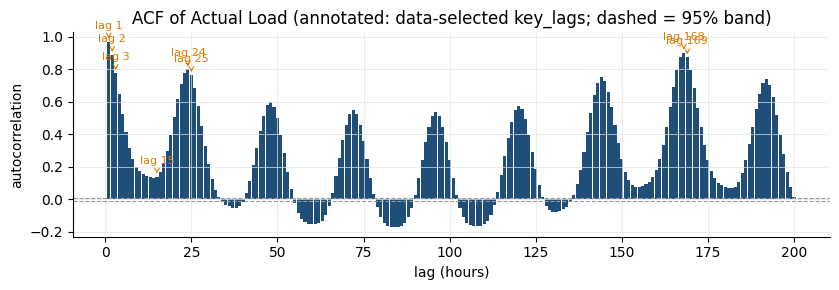

In [17]:
#| label: fig-team4-acf
#| echo: true
#| fig-cap: Autocorrelation of the hourly `Actual Load` up to lag 200, with the 95% white-noise significance band (±1.96/√N, dashed grey). The annotated `key_lags` are chosen dynamically --- the significant lags with the largest *partial* autocorrelation --- and are passed to `ConfigEntsoe(lags_consider=...)`. SpotOptim still selects the model's final lags (@sec-team4-config).
import numpy as np
import matplotlib.pyplot as plt
from spotforecast2.stats.autocorrelation import calculate_lag_autocorrelation

# Hourly Actual Load over the training side only (mean of each hour's four
# quarter-hour values), matching the grid prepare_data() will build later.
acf_series = interim.loc[:LAST_FULL_HOUR, "Actual Load"].resample("h").mean().dropna()
acf = calculate_lag_autocorrelation(acf_series, n_lags=200)

# Data-driven key lags. The 95% white-noise band is ±1.96/sqrt(N); a lag is
# "significant" when its correlation falls outside it. We rank by the PARTIAL
# autocorrelation (PACF), which removes the correlation already carried by
# shorter lags and so flags only the lags with *direct* predictive value ---
# the standard Box-Jenkins rule. (A raw-ACF threshold is useless here: the load
# ACF decays so slowly that almost every lag clears the band.)
conf = 1.96 / np.sqrt(len(acf_series))
significant = acf[acf["partial_autocorrelation_abs"] > conf]
key_lags = sorted(significant.nlargest(8, "partial_autocorrelation_abs")["lag"].astype(int))
if not key_lags:                       # degenerate fallback (e.g. very short series)
    key_lags = [1, 2, 24, 168]

print(f"N = {len(acf_series)}  |  95% significance band = ±{conf:.4f}")
print(f"significant PACF lags (|pacf| > band): {len(significant)} of {len(acf)}")
print(f"key_lags (top {len(key_lags)} by |PACF|, in lag order): {key_lags}")
print(acf[acf["lag"].isin(key_lags)][
    ["lag", "autocorrelation", "partial_autocorrelation"]
].to_string(index=False))

fig, ax = plt.subplots(figsize=(8.5, 3.0))
ax.bar(acf["lag"], acf["autocorrelation"], width=0.9, color="#1F4E79")
ax.axhline( conf, color="#999999", lw=0.8, ls="--")
ax.axhline(-conf, color="#999999", lw=0.8, ls="--")
for lag in key_lags:
    row = acf[acf["lag"] == lag]
    if not row.empty:
        val = float(row["autocorrelation"].iloc[0])
        ax.annotate(f"lag {lag}", xy=(lag, val),
                    xytext=(lag, val + 0.08), ha="center", fontsize=8,
                    color="#E07B00",
                    arrowprops=dict(arrowstyle="->", color="#E07B00", lw=0.8))
ax.set_xlabel("lag (hours)")
ax.set_ylabel("autocorrelation")
ax.set_title("ACF of Actual Load (annotated: data-selected key_lags; dashed = 95% band)")
ax.grid(True, color="#E5E5E5", linewidth=0.5)
for s in ("top", "right"):
    ax.spines[s].set_visible(False)
fig.tight_layout()
plt.show()

### A chapter-specific forecaster factory {#sec-team4-factory}

Chapter 13 builds its forecaster with the stock `entsoe_lgbm_factory` from
`spotforecast2.tasks.task_entsoe`, whose only window feature is a single
72-hour rolling mean. This chapter supplies its own factory through the
config's `forecaster_factory` hook to add longer level-anchoring windows ---
the weekly and monthly rolling means. They give the model a direct reading of
the current load level at time scales the raw lags cannot supply, so an
anomalous frontier hour cannot set the level of the whole forecast day. The
price is a 720-hour warm-up: the first 30 days of the training window carry
no monthly mean and are consumed as history, a negligible cost against a
two-year window. Each feature is a separate `RollingFeatures` instance so the
generated column names stay unique, and the signature (`config`, keyword-only
`weight_func` and `target`) must match the stock factory's, because the
pipeline invokes every factory that way; `weight_func` carries the
gap-penalty weights from the imputation step (@sec-team4-impute).

The choice of *which* windows --- and which training objective --- is not
free, and this chapter learned that operationally. A first version of this
factory set `objective="regression_l1"` (to align the training loss with the
MAE the tuner and the leaderboard score) and added 24-hour rolling
mean/min/max features. The reasoning sounded right; the live forecast for
2026-06-05 came out almost flat (a 4.7 GW daily range against ENTSO-E's
15.5 GW, with the "peak" at night) although the training MAE was excellent.
The post-mortem found three reinforcing mechanisms. First, recursion
self-feedback: in training, a 24-hour window is computed from observed
actuals and is highly predictive, but during the ≈ 28-step live recursion it
is recomputed from the model's *own* predictions --- a model that has learned
"forecast ≈ rolling level plus corrections" collapses onto a flat fixed point
near the recent mean. At a 28-hour horizon the prediction-fed share of a
24-hour window reaches 100 %, while it stays below 39 % for 72 h, 17 % for
168 h, and 4 % for 720 h --- which is why only the longer windows survive
below. Second, the L1 objective removed the incentive to track amplitude: a
10 GW miss at the morning peak costs no more per MW than anywhere else, and
LightGBM additionally applies `reg_alpha` as a soft threshold on leaf values,
which at the tuned `reg_alpha ≈ 45` zeroed out exactly the few-hundred-MW
intra-day corrections (under the default L2 objective the same value is
negligible against squared-error gradients). Third, the cross-validation
could not warn: every fold restarts from a fresh window of *observed* history
and scores only 24 steps, so the self-feedback that compounds over the live
bridge never appears in the backtest MAE. The factory below is the corrected
version: default L2 objective, anchored windows only.

In [18]:
#| label: team4-factory
#| echo: true
def team4_lgbm_factory(config, *, weight_func=None, target=None):
    """LightGBM recursive forecaster with anchored level windows (>= 72 h).

    Default L2 objective; window features deliberately exclude the 24-h
    scale --- short windows turn into pure self-feedback over the live
    recursion and flatten the forecast (observed 2026-06-05).
    """
    del target
    return ForecasterRecursive(
        estimator=LGBMRegressor(random_state=config.random_state, verbose=-1),
        lags=config.lags_consider[-1],
        window_features=[  # one instance per feature: keeps generated names unique
            RollingFeatures(stats="mean", window_sizes=config.window_size),  # 72 h, as stock
            RollingFeatures(stats="mean", window_sizes=24 * 7),
            RollingFeatures(stats="mean", window_sizes=24 * 30),
        ],
        weight_func=weight_func,
    )

print("team4_lgbm_factory ready: L2 objective, anchored window means (72/168/720 h)")

team4_lgbm_factory ready: L2 objective, anchored window means (72/168/720 h)


### Advanced `ConfigEntsoe` {#sec-team4-config}

Each change relative to @sec-live-config has a one-line rationale:

- All five seasonal periods --- captures multi-scale seasonality the
  recursive LGBM cannot recover from hourly lags alone.
- Data-selected lags --- the PACF-significant lags from @sec-team4-lags
  (typically hourly 1–3, daily ~24, weekly ~168), not a fixed set.
- `forecaster_factory=team4_lgbm_factory` --- the chapter's own factory
  (@sec-team4-factory): anchored rolling window means at 72/168/720 h,
  default L2 objective.
- `include_weather_windows=True` --- temperature is the dominant load
  driver below ~5 °C and above ~15 °C.
- `include_holiday_features=True` --- DE/NW public holidays shift
  weekday load by 20--30 %.
- `include_holiday_adjacency_features=True` --- Brückentage and the days
  bordering a holiday behave like partial holidays: many plants run
  reduced shifts, so load sits between the weekday and holiday profiles.
  The flag adds `is_brueckentag`, `is_before_holiday`, and
  `is_after_holiday`, computed in sf2-safe from the same DE/NW calendar.
- `poly_features_degree=2` --- bilinear weather × calendar interactions,
  capped at `max_poly_features=40` (top forty by mutual information) so the
  feature space stays compact.
- `n_trials_spotoptim=100`, `n_initial_spotoptim=50`, `number_folds=10`,
  `n_jobs_spotoptim=-1` --- a thorough surrogate search, kept fast for the live
  render by tuning in parallel across all cores. Lower the trial budget for a
  faster render, or set `n_jobs_spotoptim=None` for a deterministic one.
- `train_size` of two years --- two full seasonal cycles, clear of the
  2022/23 energy-crisis regime.

In [19]:
#| label: team4-config
#| echo: true
TRAIN_SIZE = pd.Timedelta(days=365 * 2)
PREDICT_SIZE = 24
REFIT_SIZE = 7
NUMBER_FOLDS = 10
DELTA_VAL = pd.Timedelta(hours=PREDICT_SIZE * REFIT_SIZE * NUMBER_FOLDS)
# Gap-penalty zone (hours) for weighted imputation, decoupled from the
# factory's rolling-feature windows (72/168/720 h, @sec-team4-factory). A
# narrower zone reduces the "all sample weights zero -> uniform weighting"
# warning on short CV folds.
IMPUTATION_WINDOW_SIZE = 24

ADVANCED_PERIODS = [
    Period(name="daily",     n_periods=12, column="hour",      input_range=(1, 24)),
    Period(name="weekly",    n_periods=7,  column="dayofweek", input_range=(0, 6)),
    Period(name="monthly",   n_periods=12, column="month",     input_range=(1, 12)),
    Period(name="quarterly", n_periods=4,  column="quarter",   input_range=(1, 4)),
    Period(name="yearly",    n_periods=12, column="dayofyear", input_range=(1, 365)),
]

team4_config = ConfigEntsoe(
    country_code="DE",
    data_filename="interim/energy_load.csv",
    targets=["Actual Load"],
    agg_weights=[1.0],
    bounds=None,
    data_loader=entsoe_data_loader,
    test_data_loader=entsoe_test_data_loader,
    forecaster_factory=team4_lgbm_factory,
    periods=ADVANCED_PERIODS,
    lags_consider=key_lags,
    train_size=TRAIN_SIZE,
    end_train_default=LAST_FULL_HOUR.isoformat(),
    delta_val=DELTA_VAL,
    predict_size=LIVE_N_STEPS,
    cv_block_size=PREDICT_SIZE,
    refit_size=REFIT_SIZE,
    number_folds=NUMBER_FOLDS,
    imputation_window_size=IMPUTATION_WINDOW_SIZE,
    n_trials_optuna=15,
    n_trials_spotoptim=100,
    n_initial_spotoptim=50,
    #n_jobs_spotoptim=None,
    warm_start_lags=True,
    include_weather_windows=True,
    include_holiday_features=True,
    include_holiday_adjacency_features=True,  # Brückentag + day before/after holiday (sf2-safe >= 15.9.0)
    poly_features_degree=2,
    max_poly_features=40,
    state="NW",
    random_state=42,
    on_weather_failure="skip",
    # New exogenous providers (sf2-safe >= 15.7.0), each gated by one flag and
    # appended by the live MultiTask pipeline (@sec-team4-exog). All are
    # day-ahead or static published vintages, hence leakage-clean (CR-3).
    include_entsoe_forecast_load=False,       # ENTSO-E day-ahead Forecasted Load (near-oracle D-1 prior)
    include_entsoe_renewable_forecast=True,  # day-ahead wind + solar generation forecast
    include_entsoe_net_load=True,            # forecasted load - (wind + solar) forecast
    include_entsoe_day_ahead_price=True,     # DE/LU day-ahead spot price
    include_covid_infection_rate=True,       # bundled RKI national 7-day incidence (lockdown-level proxy)
    on_exog_provider_failure="skip",         # degrade gracefully if a side-table is short of the full window
    exog_max_gap_hours=3,                    # heal interior side-table pinholes of up to 3 h (sf2-safe >= 16.1.0)
    exog_max_tail_gap_hours=48,              # hold the unpublishable day-ahead frontier tail (sf2-safe >= 16.2.0)
    exog_provider_window="train",            # validate providers only on [start_train, cov_end], not all history
    # Target-side corruption policy (sf2-safe >= 16.4.0): the value-sanity
    # tripwire's rules (@sec-team4-cutoff), re-checked at 15-min cadence
    # inside prepare_data — this is the authoritative run. With "truncate"
    # (the chapter default since 2026-06-05) a corrupt frontier retracts
    # data_end to the last sound hour and auto-extends predict_size, so the
    # forecast still reaches the target day on sound published history;
    # "abort" (the library default) is the conservative alternative.
    target_qc_range_mw=MAX_INTRAHOUR_RANGE_MW,
    target_qc_step_mw=MAX_ADJ_STEP_MW,
    target_qc_window_days=QC_WINDOW_DAYS,
    target_corruption_policy=TARGET_CORRUPTION_POLICY,
)
team4_config.data_frame_name = "ddmo-live-team4"
print("team4_config ready:", team4_config.data_frame_name,
      "| predict_size=", team4_config.predict_size,
      "| n_trials_spotoptim=", team4_config.n_trials_spotoptim,
      #"| n_jobs_spotoptim=", team4_config.n_jobs_spotoptim,
      "| number_folds=", team4_config.number_folds)

team4_config ready: ddmo-live-team4 | predict_size= 33 | n_trials_spotoptim= 100 | number_folds= 10


#### What each constant and argument means

The cell defines two things: a handful of local constants that fix the
cross-validation geometry and the feature menu, and the `ConfigEntsoe`
object that records every choice the pipeline reads. The value shown for
each item is the one used here.

Local constants --- the cross-validation geometry:

- `TRAIN_SIZE` --- length of the rolling training window, a
  `pd.Timedelta`. Here `pd.Timedelta(days=365 * 2)`, i.e. two years.
  Example: a fold whose `end_train` is `2026-05-20 23:00` reaches back to
  roughly `2024-05-21 00:00`. Two years cover every seasonal scale the
  `Period` encodings model twice over, while keeping the distorted
  2022/23 energy-crisis demand out of the fit.
- `PREDICT_SIZE` --- length of one forecast block in hours. `24` is one
  day. It feeds `DELTA_VAL` only; the config's live horizon is
  `predict_size=LIVE_N_STEPS` (below), not this fixed `24`.
- `REFIT_SIZE` --- spacing, in days, at which the model is refit while
  back-testing. `7` means a weekly refit.
- `NUMBER_FOLDS` --- number of time-ordered cross-validation folds. `10`.
- `DELTA_VAL` --- total validation span reserved for the rolling CV,
  `pd.Timedelta(hours=PREDICT_SIZE * REFIT_SIZE * NUMBER_FOLDS)` =
  `24 × 7 × 10 = 1680` h = 70 days. The most recent 70 days of history are held out for evaluation. This constant is explained in detail in @sec-cross-validation-geometry.
- `ADVANCED_PERIODS` --- a list of `Period` cyclical encodings, one per
  seasonal scale. Each `Period(name, n_periods, column, input_range)`
  reads `column` off the timestamp, treats its values as living on
  `input_range`, and encodes them with `n_periods` smooth basis functions.
  Example: `Period("daily", 12, "hour", (1, 24))` turns the hour-of-day
  into 12 daily encodings; `Period("weekly", 7, "dayofweek", (0, 6))` gives
  a seven-way day-of-week encoding.

(The autoregressive lags are no longer a constant here: `key_lags` is
selected from the data in @sec-team4-lags and passed straight to
`lags_consider` below.)

`ConfigEntsoe` --- identity and data source:

- `country_code="DE"` --- ISO 3166-1 alpha-2 code; selects both the
  ENTSO-E query and the national holiday calendar.
- `data_filename="interim/energy_load.csv"` --- path, under the data home,
  of the merged interim frame to read (the file profiled in
  @sec-team4-interim).
- `targets=["Actual Load"]` --- the column(s) to forecast; one target here.
- `agg_weights=[1.0]` --- per-target weight used when several targets are
  aggregated into one score; with a single target it is `1.0`.
- `bounds=None` --- per-target outlier limits, left unset here on purpose.
  A fixed pair like `±1e9` MW would never flag anything; instead the bounds
  are *derived from the long load history* (relaxed `median ± 5·IQR`, lower
  floored at 0 MW) and assigned just before detection in @sec-team4-outliers.
  These hard bounds are the only step that marks anomalies; the
  IsolationForest pass is report-only logging (see @sec-team4-outliers).

`ConfigEntsoe` --- pipeline wiring (callables):

- `data_loader=entsoe_data_loader` --- function `loader(config)` that
  returns the training DataFrame; invoked by `prepare_data()`.
- `test_data_loader=entsoe_test_data_loader` --- function returning
  ground-truth values for the horizon, used to populate `test_actual` and
  `metrics_future` when they exist.
- `forecaster_factory=team4_lgbm_factory` --- the chapter's own factory
  (@sec-team4-factory) that builds the LightGBM recursive forecaster the
  search then tunes: the stock 72-hour rolling mean plus weekly and
  monthly means, all long enough to stay anchored in observed history
  over the live recursion.

`ConfigEntsoe` --- features:

- `periods=ADVANCED_PERIODS` --- wire in the seasonal encodings above.
- `lags_consider=key_lags` --- the data-selected candidate lags computed in
  @sec-team4-lags. Paired with `warm_start_lags=True` (below), this list is
  injected as a candidate in the tuner's lag search and seeded as its first
  evaluation; see the note after this list for exactly how it is consumed.
- `include_weather_windows=True` --- add rolling weather-window features.
- `include_holiday_features=True` --- add public-holiday indicators,
  regionalised by `state`.
- `poly_features_degree=2` --- generate pairwise bilinear interaction terms
  (`1` would disable interactions).
- `max_poly_features=40` --- keep only the forty most informative interaction
  columns, ranked by mutual information with the target.
- `state="NW"` --- the German subdivision code (North Rhine-Westphalia)
  driving the regional holiday calendar.
- `include_entsoe_forecast_load=True` --- append ENTSO-E's day-ahead
  `Forecasted Load` as the `entsoe_forecasted_load` feature, a near-oracle
  prior published `D-1`.
- `include_entsoe_renewable_forecast=True` --- append the day-ahead wind and
  solar generation forecast (`entsoe_wind_forecast`, `entsoe_solar_forecast`).
- `include_entsoe_net_load=True` --- append the derived net load
  (`entsoe_net_load` = forecasted load − wind − solar), the residual demand the
  dispatchable fleet must cover.
- `include_entsoe_day_ahead_price=True` --- append the DE/LU day-ahead spot
  price (`entsoe_day_ahead_price`).
- `include_covid_infection_rate=True` --- append the bundled German national
  COVID-19 7-day incidence (`covid_infection_rate`), a slow lockdown-level
  proxy that is zero outside the pandemic window.
- `on_exog_provider_failure="skip"` --- if a provider's side-table does not
  cover the full feature window, log a warning and omit that provider's
  columns rather than abort (`"raise"`, the default, would fail loud).
- `exog_max_gap_hours=3` --- heal interior holes of up to three consecutive
  hours in a provider side-table (time interpolation) instead of discarding
  the whole provider. Real archives contain pinhole gaps --- one missing
  midnight hour per New Year's Eve, the occasional short outage --- and
  without healing a single such hour silently costs the model the entire
  feature. The budget is deliberately tight: anything longer than three
  hours inside the training window is a data-quality problem the pipeline
  should surface, not paper over.
- `exog_max_tail_gap_hours=48` --- a separate, larger budget for one
  structural special case: the trailing run at the day-ahead publication
  frontier. ENTSO-E publishes day-ahead values only through the end of
  tomorrow's CET/CEST day, while the pipeline's covariate window `cov_end`
  extends `predict_size` hours past the last data row, so a live run always
  ends with a tail of unpublishable hours (about 29 in an evening run, up
  to ~48 after a morning render). That tail is held as a zero-order
  continuation of the most recent published vintage. The two budgets are
  independent in effect: the tail allowance never licenses interior
  interpolation, which stays bounded by the 3 h budget above. Gaps
  exceeding their budget are never patched --- the run stays missing in
  full, so the provider is still dropped (or raises) rather than
  fabricated. Every healed gap is logged at WARNING level with its span,
  which keeps the imputation auditable (Art. 12), and both heals are
  leakage-clean (CR-3) because they only reuse values published before the
  forecast is made.
- `exog_provider_window="train"` --- validate each provider only on the
  window the model actually consumes, `[start_train, cov_end]`, instead of
  the full data history. The day-ahead price is the motivating case: the
  DE-LU bidding zone only exists since October 2018, so against the full
  2015-anchored history the price provider can never validate, while inside
  the two-year training window it is complete. The default `"full"`
  keeps the stricter behaviour.

::: {.callout-note title="Where `key_lags` is used --- and who really picks the lags"}
A natural question is whether `lags_consider=key_lags` fixes the lags the
model forecasts on, or whether the tuner decides. In the tuned `spotoptim`
run this chapter performs (`MultiTask(team4_config, task="spotoptim")`), the
tuner still chooses the winner, but with `warm_start_lags=True` the
data-selected list now genuinely competes. Three steps consume it:

1. The chapter's forecaster factory `team4_lgbm_factory`
   (@sec-team4-factory) builds the *initial* forecaster with
   `lags=config.lags_consider[-1]` --- only the largest entry. With the
   data-selected `key_lags` (whose maximum is the weekly lag, around `168`),
   `initialize_lags` expands that maximum to the full contiguous range
   `1…max`, not the individual selected lags.
2. SpotOptim treats the lag configuration as a categorical hyperparameter
   and searches a candidate set. This chapter passes its own
   `team4_search_space` (@sec-team4-search-space), a superset of the
   package's hardcoded default (`_default_spotoptim_search_space` in
   `spotforecast2/multitask/search_spaces.py` --- e.g. `"24"`,
   `"[1, 2, 24, 48]"`, `"[1, 2, 11, 12, 23, 24, 167, 168]"`). With
   `warm_start_lags=True`, `SpotOptimStrategy` *prepends* `str(key_lags)` to
   that list, so the PACF-selected lags become a real, selectable candidate.
3. The same flag seeds the surrogate search: `build_warm_start_x0`
   constructs the optimizer's first evaluation point at `key_lags` (combined
   with the factory's estimator defaults) and passes it as SpotOptim's `x0`,
   so the seeded configuration is guaranteed to be evaluated rather than left
   to chance in the random initial design. The winner is applied with
   `set_lags`, logged as "Best lags", and inspectable via exercise 3.

A consequence worth flagging: `initialize_lags` expands an *integer* candidate
to the contiguous range `1…max`, but leaves a *list* candidate untouched. So
when the logged "Best lags" come back gapless (e.g. `1…24`), it means the
integer candidate `"24"` won the back-test --- not that the search cannot carry
gaps. The candidate set above includes genuine non-contiguous sets such as
`[1, 2, 11, 12, 23, 24, 167, 168]`, and the winning lags are free to be one of
them; the weekly lag survives in the search whether or not it wins.

So under `warm_start_lags=True` the ACF analysis in @sec-team4-lags no longer
only *motivates* candidate lags --- it injects them into the search and seeds
the optimizer with them, while the tuner still has the final say among all
candidates. With `warm_start_lags=False` (the default), `lags_consider`
reverts to its passive role: only its maximum (`lags_consider[-1]`) sizes the
pre-tuning forecaster and the minimum history the back-test reserves, and the
tuner picks from the explicit candidate list alone.
:::

`ConfigEntsoe` --- training window, horizon, refit:

- `train_size=TRAIN_SIZE`, `delta_val=DELTA_VAL`, `refit_size=REFIT_SIZE`,
  `number_folds=NUMBER_FOLDS` --- hand the CV geometry above to the config.
- `end_train_default=LAST_FULL_HOUR.isoformat()` --- ISO timestamp
  anchoring the end of training: the last full hour of published actuals
  (@sec-team4-cutoff). Example: `"2026-05-20T23:00:00+00:00"`.
- `predict_size=LIVE_N_STEPS` --- the live horizon in hours, i.e. the
  recursive bridge from `end_train` through tomorrow 23:00 UTC, which is
  longer than the fixed `PREDICT_SIZE=24`.
- `cv_block_size=PREDICT_SIZE` --- the cross-validation test-block width (24 h),
  fixed and decoupled from the render-dependent live `predict_size`. Leaving it
  unset would make the CV inherit `predict_size=LIVE_N_STEPS`; pinning it at 24
  keeps the fold geometry stable across renders (@sec-cross-validation-geometry).

`ConfigEntsoe` --- search budget and reproducibility:

- `n_trials_optuna=15` --- Optuna Bayesian-search trial budget.
- `n_trials_spotoptim=100` --- SpotOptim surrogate-search trial budget.
- `n_initial_spotoptim=50` --- SpotOptim initial random evaluations before
  the surrogate model takes over.
- `n_jobs_spotoptim=-1` --- run the SpotOptim search in parallel across all
  CPU cores (`-1`; a positive integer pins the worker count, `None` --- the
  config default --- keeps it sequential). Each trial is a full CV back-test
  over the 70 folds (@sec-cross-validation-geometry), so distributing trials
  across cores is the main lever for absorbing the render-time cost of a larger
  `n_trials_spotoptim`. SpotOptim evaluates the objective in worker processes;
  `spotforecast2` rebuilds the tuning table from the optimiser's own evaluation
  history, so the result is complete regardless of worker count. Because those
  workers are spawned from a Jupyter kernel at render time, the imports cell
  (@sec-team4-example) selects the `fork` start method so they inherit the
  loaded modules; without it the pool cannot start under Quarto.
- `warm_start_lags=True` --- inject `key_lags` as a candidate lag set and
  seed the surrogate search's first evaluation with it (see the note above).
- `random_state=42` --- RNG seed fixing tuning and model randomness. With
  *serial* tuning the render is bit-reproducible (CR-2). `n_jobs_spotoptim=-1`
  trades that for speed: SpotOptim's steady-state parallel loop evaluates
  trials in a worker-completion order that varies from run to run, so the tuned
  "Best lags" and the resulting forecast can differ slightly between renders
  even at a fixed seed. The safety contracts (24-row schema, strictly-positive
  forecasts, deadline) hold either way --- only bit-for-bit reproducibility is
  relaxed. Set `n_jobs_spotoptim=None` to restore a fully deterministic run.
- `on_weather_failure="skip"` --- if the Open-Meteo fetch fails, log a
  warning and continue with empty weather features rather than abort;
  `"raise"` (the default) would fail loud instead.

Finally, the post-construction assignment
`team4_config.data_frame_name = "ddmo-live-team4"` names the cache
subdirectory, the saved-model files, and the per-dataset log for this run.

### A weekly-anchored search space {#sec-team4-search-space}

One more knob is set outside the config. SpotOptim's default search space
(`_default_spotoptim_search_space` in
`spotforecast2/multitask/search_spaces.py`) offers exactly six lag
candidates, all hardcoded --- and four of them (`"24"`, `"48"`,
`"[1, 2, 24, 48]"`, `"[1, 2, 23, 24, 47, 48]"`) contain no lag beyond 48.
For the frozen back-test that is harmless, but for the live recursion it is
not: a lag only reads *observed* data while it reaches past the forecast
origin, so over the ≈ 28-hour live bridge every lag ≤ 24 is soon fed the
model's own predictions, while the weekly lag 167/168 stays anchored in real
history over any horizon up to a week. The 2026-06-05 incident
(@sec-team4-factory) made this concrete --- the anchor-free candidate
`[1, 2, 24, 48]` won that tuning run and contributed to the flat forecast.
The chapter's search space therefore keeps the default's eight estimator
dimensions but requires every lag candidate to carry the weekly anchor. One
estimator dimension deviates from the default on purpose: `n_estimators` uses
a *linear* integer range, because SpotOptim used to int-cast log-transformed
bounds, and an integer `log10` dimension therefore degenerated to the decade
exponents — the tuner could only ever try 10, 100, 1000 or 10000 trees, and
the last value silently exceeded a declared cap of 5000 (observed on
2026-06-05; fixed upstream in spotoptim 0.12.7, which now searches such
dimensions continuously in log space and rounds in natural scale). The linear
range is kept regardless: for a bounded tree count it is the more transparent
choice, and it does not depend on the installed optimizer version. Two
candidates extend the pool: the union of the PACF-selected `key_lags` with
the canonical `{1, 2, 24, 48, 168}` family, and an extended family with the
*neighbours* of the daily and weekly cycles (23/25, 47, 167/169) plus the
two-week lag 336, which survives a holiday-distorted previous week.

In [20]:
#| label: team4-search-space
#| echo: true
team4_search_space = {
    "estimator__num_leaves": (8, 1024),
    "estimator__max_depth": (3, 32),
    "estimator__learning_rate": (0.0001, 0.3, "log10"),
    # Linear integer range, deliberately NOT (10, 5000, "log10"): SpotOptim
    # < 0.12.7 int-cast log-transformed bounds, so an int+log10 dimension
    # collapsed to the decade exponents {10, 100, 1000, 10000} — four values
    # only, the last of which silently EXCEEDED the declared cap (observed
    # 2026-06-05: the tuner picked 10000 trees from a "5000" bound; fixed
    # upstream in spotoptim 0.12.7). The linear range stays: transparent and
    # optimizer-version independent.
    "estimator__n_estimators": (100, 5000),
    "estimator__bagging_fraction": (0.5, 1.0),
    "estimator__feature_fraction": (0.5, 1.0),
    "estimator__reg_alpha": (0.001, 10.0),
    "estimator__reg_lambda": (0.001, 10.0),
    # Every candidate carries the weekly anchor 167/168: lags beyond the live
    # horizon keep reading observed history during the recursion. Anchor-free
    # stock candidates ("24", "48", ...) are deliberately excluded.
    "lags": [
        "[1, 2, 3, 11, 12, 22, 23, 24, 47, 48, 167, 168]",   # stock 12-lag
        "[1, 2, 11, 12, 23, 24, 167, 168]",                   # stock 8-lag
        "[1, 2, 24, 48, 167, 168]",                           # compact + weekly anchor
        "[1, 2, 23, 24, 47, 48, 167, 168]",                   # cycle neighbours + weekly
        str(sorted(set(key_lags) | {1, 2, 24, 48, 168})),     # PACF picks ∪ canonical family
        "[1, 2, 3, 23, 24, 25, 47, 48, 167, 168, 169, 336]",  # extended + 2-week lag
    ],
}
anchored = all(("167" in c) or ("168" in c) for c in team4_search_space["lags"])
print(f"{len(team4_search_space['lags'])} lag candidates "
      f"(+ key_lags via warm start) | all weekly-anchored: {anchored}")

6 lag candidates (+ key_lags via warm start) | all weekly-anchored: True


Two mechanics are worth knowing. First, `MultiTask.run()` does *not* forward
a search space --- its dispatcher calls each task with `show` only --- so the
training cell in @sec-team4-run invokes `run_task_spotoptim(search_space=...)`
directly; with no `search_space` argument that method falls back to the
default space, which is exactly how chapter 13 runs. Second, the custom space
composes cleanly with `warm_start_lags=True`: `SpotOptimStrategy` deep-copies
whatever space it receives and prepends `str(key_lags)` to its `"lags"` list,
so the PACF-selected set is still injected as a seventh candidate and seeded as
the optimiser's first evaluation, as described in the note above.

The `MultiTask` orchestrator runs the full pipeline in one call, but a
safety-critical forecaster is only trustworthy if its inputs are
auditable. The next six subsections run the pipeline one method at a
time and inspect the data each step produces --- endogenous series,
curation, imputation, exogenous features, the tuned forecast, and the
feature attributions. Each method mutates `team4_mt` in place, so the
cells must run top to bottom.

### Cross-validation geometry recap {#sec-cross-validation-geometry}

The four constants defined at the top of @sec-team4-config ---
`PREDICT_SIZE`, `REFIT_SIZE`, `NUMBER_FOLDS`, and the `DELTA_VAL` they
combine into --- do one job: they fix the *cross-validation geometry* that
SpotOptim scores every candidate model against. The config explainer above
quoted the result ("the most recent 70 days are held out"); this section
derives that number from scratch and shows exactly how the rolling
back-test that produces SpotOptim's objective is laid out. It is
self-contained --- it reuses the chronological-split idea of @sec-split and
the rolling-origin back-test of @sec-backtest, but every term needed is
defined here.

#### Definitions

The pipeline reasons about one contiguous, hourly, gap-free load series.
The following terms pin down how that series is carved up for tuning.

Training series
:   the full hourly `Actual Load` the tuner is allowed to look at. It runs
    from `start_train` to `end_train`.

`end_train`
:   the last timestamp the model may train on --- here `LAST_FULL_HOUR`, the
    last full hour of published actuals (@sec-team4-cutoff). Everything after
    it is the live forecast, never part of tuning.

`train_size`
:   the length of the training series as a duration. `start_train =
    end_train − train_size`. Here two years.

`predict_size`
:   the *live* forecast horizon --- how many hours the model is asked to
    forecast forward in production. The live config sets it to `LIVE_N_STEPS`
    (@sec-team4-cutoff), the recursive bridge to tomorrow 23:00, so it is
    render-dependent (≈ 32). It does *not* set the cross-validation block; that
    is `cv_block_size`.

`cv_block_size`
:   the width of each cross-validation test block, in hours --- the horizon the
    folds actually score. The config sets it to `PREDICT_SIZE = 24` (one day),
    fixed and independent of the render-dependent `predict_size`. Decoupling the
    two is deliberate: the CV scores a stable 24-hour-ahead block while the live
    forecast still runs out to `LIVE_N_STEPS`. (When `cv_block_size` is left
    unset it falls back to `predict_size` --- the behaviour chapters 02--11 rely
    on, where the two coincide at 24.)

`delta_val`
:   the validation span: the stretch of the most recent history reserved for
    evaluation and withheld from the model's training. It is computed, not
    chosen directly --- see below.

`end_cv`
:   the cross-validation training cutoff, `end_cv = end_train − delta_val`.
    The model is trained on `[start_train, end_cv]` and validated on
    `(end_cv, end_train]`.

Fold
:   one (train, test) pair. Every fold trains on data ending at or before its
    test block and predicts the next `cv_block_size` hours --- so a fold never
    peeks at its own future, the discipline introduced in @sec-split.

Fold stride
:   how far the test block advances between consecutive folds. Here it equals
    `cv_block_size = 24`, so the folds are back-to-back and non-overlapping:
    together they tile the whole validation span exactly once.

Rolling-origin back-test
:   the procedure (@sec-backtest) that slides the forecast origin forward one
    stride at a time across the validation span, collecting a forecast at each
    step. With `refit=False` the forecaster is fit *once* on `[start_train,
    end_cv]` and then reused to produce every fold's forecast --- fast, and a
    deterministic choice (CR-2).

Mean absolute error (MAE)
:   the score. The fold forecasts are pooled into one vector $\hat{y}$,
    compared with the matching actuals $y$, and averaged:
    $\text{MAE} = \tfrac{1}{n}\sum_{t=1}^{n}\lvert y_t - \hat{y}_t\rvert$.
    This single number, over all validation hours, is what SpotOptim
    minimises.

#### Computing `DELTA_VAL`

Write $p$ for the per-fold forecast block (`PREDICT_SIZE`, 24 h), $r$ for the
refit spacing (`REFIT_SIZE`, 7), and $K$ for the number of cross-validation
folds (`NUMBER_FOLDS`, 10). The validation span $\Delta_{\mathrm{val}}$
(`DELTA_VAL`) is their product, read as hours:

$$
\Delta_{\mathrm{val}}
  = \underbrace{p}_{24\ \text{h/fold}}
  \times \underbrace{r}_{7}
  \times \underbrace{K}_{10}
  = 24 \times 7 \times 10 = 1680\,\text{h} = 70\,\text{days}.
$$

This span is then sliced off the *tail* of the training series. Write $N$ for
the training-series length (`train_size`). With `end_cv = end_train − delta_val`,
the series splits cleanly into a CV training window
$N_{\mathrm{cv}} = N - \Delta_{\mathrm{val}}$ and a validation part whose lengths
add up to $N$:

$$
\underbrace{N}_{2\ \text{yr}\,=\,17520\,\text{h}}
  = \underbrace{N - \Delta_{\mathrm{val}}}_{\text{CV training window } N_{\mathrm{cv}}}
  + \underbrace{\Delta_{\mathrm{val}}}_{\text{validation span}}
  = 15840\,\text{h} + 1680\,\text{h}.
$$

The fold count then falls straight out of the geometry. Write $b$ for the CV
block length (`cv_block_size`, fixed to $p = 24$ h). The folds are
non-overlapping blocks of $b = 24$ hours that tile the validation span, so their
number $F$ is

$$
F
  = \frac{\Delta_{\mathrm{val}}}{b}
  = \frac{1680}{24}
  = r \times K
  = 7 \times 10 = 70,
$$

and the total validation hours scored is $70 \times 24 = 1680 =
\Delta_{\mathrm{val}}$. The `70/70` progress bars at @sec-team4-run are exactly
this count, the same for every render. The clean identity holds *because* we set
`cv_block_size = PREDICT_SIZE`. Had the CV instead inherited the live
`predict_size = LIVE_N_STEPS` (≈ 32 h) --- as it did before the `cv_block_size`
field existed --- the block would tile the span into `⌈1680 / 32⌉ = 53` folds,
and the count would drift render to render with the feed's freshness
(@sec-team4-cutoff). Decoupling the CV block from the live horizon is exactly
what `cv_block_size` buys.

A note on the names, so the arithmetic is not mistaken for behaviour the code
does not have. In *this* cross-validation the model is fit once and reused
(`refit=False`), so `REFIT_SIZE` does not trigger any refitting --- it is one of
two factors whose product, with `PREDICT_SIZE`, sizes the held-out span.
Likewise `NUMBER_FOLDS` enters only through that product; because we set
`cv_block_size = PREDICT_SIZE`, the real fold count is the 70 derived above, not
10. The constants are a convenient way to *spell* a 70-day window as "ten weekly
blocks of daily forecasts", not a description of a ten-fold refit loop.
(Internally `cv_ts` in `spotforecast2` reads `cv_block_size` --- falling back to
`predict_size` when it is unset --- sets `end_cv = end_train − delta_val`, and
returns a `TimeSeriesFold(steps=cv_block_size, refit=False,
allow_incomplete_fold=True)` --- the same `TimeSeriesFold` machinery used in
@sec-backtest.)

#### A toy example you can check by hand

The real case (dozens of folds) is hard to draw, so first shrink every constant.
Take `predict_size = 2`, `refit_size = 2`, `number_folds = 3`, and a training
series of `train_size = 30` time units. Then

$$
\Delta_{\mathrm{val}} = 2 \times 2 \times 3 = 12,\quad
N_{\mathrm{cv}} = 30 - 12 = 18,\quad
F = \tfrac{12}{2} = 6.
$$

Index the series $0,1,\dots,29$. Training is the fixed block $[0, 18)$; the
six test blocks tile the last twelve positions, each two wide:

| fold | trains on | tests on |
|:----:|:---------:|:--------:|
| 1 | [0, 18) | [18, 20) |
| 2 | [0, 18) | [20, 22) |
| 3 | [0, 18) | [22, 24) |
| 4 | [0, 18) | [24, 26) |
| 5 | [0, 18) | [26, 28) |
| 6 | [0, 18) | [28, 30) |

The model is fit once on $[0,18)$, makes six successive 2-step forecasts that
march across $[18,30)$, and the MAE is taken over all $6 \times 2 = 12$
predicted positions. In this toy the block (`cv_block_size = 2`) equals the unit
that sizes `delta_val`, so the fold count is the clean `delta_val / cv_block_size
= 6`. The schematic below draws exactly this layout; the real configuration is
the same picture with 70 daily (24-hour) blocks instead of six 2-step ones ---
the live `predict_size = LIVE_N_STEPS` plays no part in the CV geometry, only in
the production forecast.

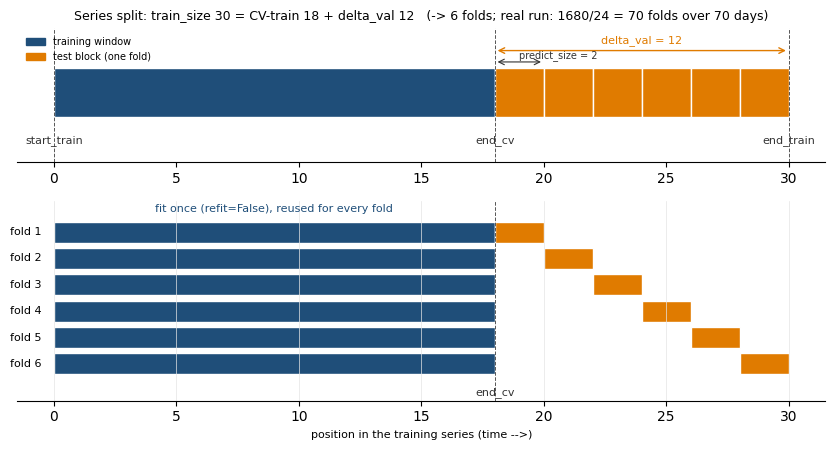

In [21]:
#| label: fig-team4-cv-geometry
#| echo: true
#| fig-cap: 'Cross-validation geometry behind `DELTA_VAL`, drawn with the toy constants `predict_size=2, refit_size=2, number_folds=3, train_size=30` (so `delta_val=12` and 6 folds). Top: the series splits into a fixed training window `[start_train, end_cv]` (blue) and the held-out validation span `delta_val` (orange), tiled by non-overlapping `predict_size`-wide folds. Bottom: the rolling-origin back-test --- the model is fit once and reused, the test block sliding forward one stride per fold. The real run uses the same picture with 70 daily (`cv_block_size=24`) folds over the 70-day span, independent of the live `predict_size`.'
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Toy constants (small enough to draw every block); the real run scales these
# to PREDICT_SIZE=24, REFIT_SIZE=7, NUMBER_FOLDS=10 -> 1680 h (70-day) span,
# tiled into cv_block_size=24-h blocks -> 1680/24 = 70 folds (render-independent).
PS, RS, NF = 2, 2, 3          # cv_block_size, refit_size, number_folds
TRAIN = 30                    # train_size, in the same time units as the folds
DV = PS * RS * NF             # delta_val = 12
CVT = TRAIN - DV              # CV training window = 18
NFOLDS = DV // PS             # number of folds = 6

BLUE, ORANGE, GREY, GRID = "#1F4E79", "#E07B00", "#999999", "#E5E5E5"

fig, (axA, axB) = plt.subplots(
    2, 1, figsize=(8.5, 4.6), gridspec_kw={"height_ratios": [1.0, 1.5]}
)

# --- Panel A: the split of the training series --------------------------------
axA.add_patch(mpatches.Rectangle((0, 0), CVT, 1, facecolor=BLUE,
                                 edgecolor="white", label="CV training window"))
for k in range(NFOLDS):
    axA.add_patch(mpatches.Rectangle((CVT + k * PS, 0), PS, 1, facecolor=ORANGE,
                                     edgecolor="white"))
# marker lines + labels for the three anchors
for x, lab in [(0, "start_train"), (CVT, "end_cv"), (TRAIN, "end_train")]:
    axA.axvline(x, color="#555555", lw=0.7, ls="--")
    axA.text(x, -0.35, lab, ha="center", va="top", fontsize=8, color="#333333")
# delta_val span annotation
axA.annotate("", xy=(CVT, 1.35), xytext=(TRAIN, 1.35),
             arrowprops=dict(arrowstyle="<->", color=ORANGE, lw=1.0))
axA.text((CVT + TRAIN) / 2, 1.5, f"delta_val = {DV}", ha="center",
         fontsize=8, color=ORANGE)
# one predict_size block annotation
axA.annotate("", xy=(CVT, 1.12), xytext=(CVT + PS, 1.12),
             arrowprops=dict(arrowstyle="<->", color="#333333", lw=0.8))
axA.text(CVT + PS / 2, 1.2, f"predict_size = {PS}", ha="left", fontsize=7,
         color="#333333")
axA.set_xlim(-1.5, TRAIN + 1.5)
axA.set_ylim(-0.9, 1.8)
axA.set_yticks([])
axA.set_title(f"Series split: train_size {TRAIN} = CV-train {CVT} + delta_val {DV}"
              f"   (-> {NFOLDS} folds; real run: 1680/24 = 70 folds over 70 days)",
              fontsize=9)
for s in ("top", "right", "left"):
    axA.spines[s].set_visible(False)

# --- Panel B: the rolling-origin folds, one per row ---------------------------
for k in range(NFOLDS):
    y = NFOLDS - 1 - k                       # fold 1 on top
    axB.add_patch(mpatches.Rectangle((0, y + 0.1), CVT, 0.8, facecolor=BLUE,
                                     edgecolor="white"))
    axB.add_patch(mpatches.Rectangle((CVT + k * PS, y + 0.1), PS, 0.8,
                                     facecolor=ORANGE, edgecolor="white"))
    axB.text(-0.5, y + 0.5, f"fold {k + 1}", ha="right", va="center", fontsize=8)
axB.axvline(CVT, color="#555555", lw=0.7, ls="--")
axB.text(CVT, -0.4, "end_cv", ha="center", va="top", fontsize=8, color="#333333")
axB.text(CVT / 2, NFOLDS + 0.25, "fit once (refit=False), reused for every fold",
         ha="center", fontsize=8, color=BLUE)
axB.set_xlim(-1.5, TRAIN + 1.5)
axB.set_ylim(-0.9, NFOLDS + 0.7)
axB.set_yticks([])
axB.set_xlabel("position in the training series (time -->)", fontsize=8)
axB.grid(True, axis="x", color=GRID, linewidth=0.5)
for s in ("top", "right", "left"):
    axB.spines[s].set_visible(False)

# shared legend
handles = [mpatches.Patch(color=BLUE, label="training window"),
           mpatches.Patch(color=ORANGE, label="test block (one fold)")]
axA.legend(handles=handles, loc="upper left", fontsize=7, frameon=False)

fig.tight_layout()
plt.show()

#### The real configuration

Substituting the chapter's constants reproduces the numbers quoted at
@sec-team4-config:

- validation span: `delta_val = 24 × 7 × 10 = 1680` h = 70 days, held out as
  `(end_cv, end_train]` with `end_cv = end_train − 70 days`;
- CV training window: `17520 − 1680 = 15840` h ≈ 1.81 years, the fixed block
  the forecaster is fit on once;
- folds: `1680 / cv_block_size = 1680 / 24 = 70` non-overlapping daily blocks
  tiling the 70-day span --- the same count for every render, because
  `cv_block_size` is fixed at 24 and does not track the live `predict_size`;
- scored hours: `70 × 24 = 1680 = delta_val`, pooled into the single MAE
  SpotOptim drives down.

#### How SpotOptim consumes it

This geometry is the fixed yardstick of the search. Each SpotOptim trial
proposes one hyperparameter candidate --- including a lag set, the warm-started
`key_lags` among them (@sec-team4-config) --- builds the forecaster, runs the
70-fold rolling back-test above, and returns its pooled MAE. The surrogate
optimiser then picks the next candidate to try, always against the *same*
1680-hour validation window tiled the *same* way every render, so trials are
directly comparable. Exercise 3 inspects which lag configuration ultimately won.

::: {.callout-note title="Why `cv_block_size` is a separate knob"}
The config carries two horizons that are easy to confuse. `predict_size =
LIVE_N_STEPS` is the *live* forecast horizon --- the recursive bridge to
tomorrow 23:00, which floats with the ENTSO-E feed's freshness at render time
(≈ 25–48 h). `cv_block_size = 24` is the *cross-validation* block --- the
horizon each fold scores. Setting them apart matters for two reasons:

- The search minimises the pooled MAE of `cv_block_size`-step-ahead forecasts.
  Fixing that at a 24-hour day keeps the tuning objective aligned with the
  leaderboard's 24-hour metric, instead of a longer, render-dependent horizon.
- Because `cv_block_size` is constant, the validation protocol (block width and
  the `1680/24 = 70` fold count) is identical across renders --- the
  reproducibility (CR-2) the frozen chapters enjoy, now kept for the live one.

Were the two coupled --- `cv_block_size` left unset, so the CV inherited
`predict_size = LIVE_N_STEPS` --- the block would be ≈ 32 h, the fold count
`⌈1680/32⌉ = 53`, and both would drift between renders. That coupling is exactly
what the `cv_block_size` field (added in `spotforecast2-safe`) removes; Exercise 4
probes how much the choice of block actually moves the tuned model.
:::

### Step 1 --- Endogenous data: prepare and profile {#sec-team4-prepare}

`prepare_data()` loads the ENTSO-E DE `Actual Load` series and aggregates
the 15-minute actuals onto the hourly grid the forecaster expects (the
hourly mean of each hour's four quarter-hour values). We profile it before
any curation so later steps have a baseline to compare against.

In [22]:
#| label: team4-prepare
#| echo: true
team4_mt = MultiTask(team4_config, task="spotoptim")
team4_mt.prepare_data()

endo = team4_mt.df_pipeline
print(f"df_pipeline shape: {endo.shape}")
print(f"index range      : {endo.index.min()} → {endo.index.max()}")
print(f"cadence          : {endo.index.to_series().diff().dropna().mode().iloc[0]}  (hourly mean of the 15-min actuals)")
print(endo["Actual Load"].describe())

INFO:spotforecast2_safe.multitask.base.MultiTask:Pipeline data shape after preparation: (39184, 2)


df_pipeline shape: (39184, 2)
index range      : 2022-01-01 00:00:00+00:00 → 2026-06-21 15:00:00+00:00
cadence          : 0 days 01:00:00  (hourly mean of the 15-min actuals)
count    39184.000000
mean     53518.943873
std       9332.434455
min      30902.685000
25%      45850.224000
50%      53563.142500
75%      60450.494603
max      78680.352500
Name: Actual Load, dtype: float64


In [23]:
#| label: fig-team4-endogenous
#| echo: true
#| fig-cap: Endogenous target after `prepare_data()` --- the hourly ENTSO-E DE `Actual Load` series the advanced LGBM forecaster is tuned on, before outlier curation or imputation.
from spotforecast2.plots.time_series_visualization import visualize_ts_plotly

visualize_ts_plotly(
    {"Actual Load": team4_mt.df_pipeline[["Actual Load"]]},
    columns=["Actual Load"],
)

@fig-team4-endogenous-last-week zooms in on the last week of the endogenous target, which is the most recent data the model trains on and the closest to the forecast bridge. It is a sanity check that this window contains no unexpected gaps or anomalies before we hand it to the outlier detection step in @sec-team4-outliers.

In [24]:
#| label: fig-team4-endogenous-last-week
#| echo: true
#| fig-cap: Last week data of the endogenous target after `prepare_data()`
from spotforecast2.plots.time_series_visualization import visualize_ts_plotly

last_week = team4_mt.df_pipeline.loc[
    team4_mt.df_pipeline.index.max() - pd.Timedelta(days=7):, ["Actual Load"]
]
visualize_ts_plotly(
    {"Actual Load": last_week},
    columns=["Actual Load"],
)

### Step 2 --- Outlier detection and curation {#sec-team4-outliers}

Curation needs a bound. A fixed pair such as `±1e9` MW flags nothing, so it
removes nothing; a tight pair risks deleting genuine demand --- the January
cold-snap peaks and the holiday troughs are real records the model must see.
We want the opposite of both: bounds wide enough to keep every plausible
value, narrow enough to excise the physically impossible ones (a reported
0 MW national load, a sensor spike to ten times the peak).

We therefore derive the bounds from the load history itself, using a robust
rule that the anomalies cannot distort. Let $m$ be the median of the series
and $\mathrm{IQR}$ its inter-quartile range (the 75th minus the 25th
percentile). Median and IQR are *robust*: a handful of absurd records barely
moves them, so the band they define is not inflated by the very points we
mean to catch. The bounds are

$$
\text{lower} = \max(0,\; m - k\cdot\mathrm{IQR}), \qquad
\text{upper} = m + k\cdot\mathrm{IQR},
$$

with $k = 5$ --- a deliberately *relaxed* width. (For reference, Tukey's
"far out" fence uses $k = 3$; ours is wider still.) For German load this
places the band at roughly $[0,\,130]$ GW, so only records outside any
plausible national demand are flagged. The lower bound is floored at 0 MW
because load cannot be negative. `OUTLIER_IQR_K` is exposed as a constant:
lower it to curate more aggressively, raise it to curate only the most
extreme records.

We compute the bounds from the prepared history and assign them to
`team4_mt.config.bounds` *before* detection runs.

In [25]:
#| label: team4-outlier-bounds
#| echo: true
OUTLIER_IQR_K = 5

s = team4_mt.df_pipeline["Actual Load"].dropna()
med = s.median()
iqr = s.quantile(0.75) - s.quantile(0.25)
low = max(0.0, med - OUTLIER_IQR_K * iqr)
high = med + OUTLIER_IQR_K * iqr
team4_mt.config.bounds = [(low, high)]

n_outside = int(((s < low) | (s > high)).sum())
print(f"median             : {med:,.0f} MW")
print(f"IQR                : {iqr:,.0f} MW")
print(f"derived bounds (K={OUTLIER_IQR_K}): [{low:,.0f}, {high:,.0f}] MW")
print(f"history points out : {n_outside} of {len(s)}")

median             : 53,563 MW
IQR                : 14,600 MW
derived bounds (K=5): [0, 126,564] MW
history points out : 0 of 39184


`detect_outliers()` snapshots the pre-curation series into
`df_pipeline_original`, then replaces every value outside these bounds with
NaN in `df_pipeline` via `manual_outlier_removal` (the values are *replaced*,
not clipped to the bound). The second branch of `detect_outliers()` runs an
IsolationForest pass (`get_outliers`, `contamination=0.01`), but that call
only *reports* candidate anomalies to the log --- it does not alter the
series. The hard bounds are therefore the sole mechanism that marks NaN.
Removing implausible values here is a direct Art. 10 data governance
obligation: the model must not learn from corrupted records.

What happens to a flagged record next is the substance of curation, and it
is not deletion. The recursive LightGBM forecaster reads autoregressive lags
off a *contiguous* hourly index; dropping rows outright would misalign every
downstream lag. Instead, Step 3 (@sec-team4-impute) imputes the NaN with the
default `weighted` strategy: it forward/back-fills the gap so the index stays
gap-free, *and* it builds a sample-weight function that assigns weight 0 to
each imputed timestamp and the `imputation_window_size` h that follow it
(here 24 h; @sec-team4-impute explains why the zone extends forward, not
symmetrically). That weight
function is threaded into the forecaster (`ForecasterRecursive(weight_func=…)`),
so during `fit` the curated rows contribute nothing to the training loss and
nothing to the validation score. A flagged record is thus replaced by NaN,
filled only to preserve lag continuity, and *excluded from training and
validation* by zero weight --- the intended Art. 10 outcome, reached without
breaking the recursive feature construction.

`imputation_window_size` is a dedicated knob: it sets the gap-penalty width
*independently* of `window_size` (default 72 h), which still controls the
LightGBM rolling-mean feature window. During tuning SpotOptim evaluates many
short cross-validation folds, and a fold lying entirely inside a penalty zone
has every row at weight 0; the forecaster then logs *"all sample weights for
the requested index are zero ... using uniform weighting"* and falls back to
uniform weights for that fold. This is benign --- it is the safe degenerate
case, not an error --- but a narrower `imputation_window_size` makes it rarer
without widening the rolling-feature window.

In [26]:
#| label: team4-detect-outliers
#| echo: true
team4_mt.detect_outliers()

n_removed = int(
    (team4_mt.df_pipeline["Actual Load"].isna()
     & team4_mt.df_pipeline_original["Actual Load"].notna()).sum()
)
nan_to_impute = int(team4_mt.df_pipeline["Actual Load"].isna().sum())
imputed_idx = team4_mt.df_pipeline.index[team4_mt.df_pipeline["Actual Load"].isna()]
# Split genuine interior gaps from the unpublished trailing tail (@sec-team4-availability):
# anything at or before end_train (LAST_FULL_HOUR) is a real gap; anything after it is
# simply the recent tail ENTSO-E has not published yet, which end_train excludes from y_train.
interior_idx = imputed_idx[imputed_idx <= LAST_FULL_HOUR]
tail_idx = imputed_idx[imputed_idx > LAST_FULL_HOUR]
contamination = getattr(team4_mt.config, "contamination", None)

print(f"outliers removed   : {n_removed}")
print(f"NaN to impute next : {nan_to_impute}")
print(f"  interior gaps    : {len(interior_idx)}  (real gaps in observed range)")
print(f"  trailing tail    : {len(tail_idx)}  (unpublished, after end_train)")
print(f"contamination      : {contamination}")

INFO:spotforecast2_safe.multitask.base.MultiTask:Forecasted Load: 382 outliers automatically detected
INFO:spotforecast2_safe.multitask.base.MultiTask:Actual Load: 392 outliers automatically detected
INFO:spotforecast2_safe.multitask.base.MultiTask:Outlier detection complete.


outliers removed   : 0
NaN to impute next : 0
  interior gaps    : 0  (real gaps in observed range)
  trailing tail    : 0  (unpublished, after end_train)
contamination      : 0.01


In [27]:
#| label: fig-team4-outliers
#| echo: true
#| fig-cap: 'Outlier curation as performed by the pipeline: the pre-curation series (`df_pipeline_original`) overlaid with the curated series (`df_pipeline`), with removed points marked.'
from spotforecast2.plots.plotter import plot_with_outliers

plot_with_outliers(team4_mt.df_pipeline, team4_mt.df_pipeline_original, team4_mt.config)

### Step 3 --- Missing-data imputation {#sec-team4-impute}

`impute()` fills the gaps left by curation (and any pre-existing gaps) so
the recursive forecaster sees a gap-free series. Under Art. 10 every
filled value is a modelling assumption, so we verify the count goes to
zero rather than trusting the call silently.

The strategy is the package default, `imputation_method="weighted"` (set
in `ConfigEntsoe`; this chapter does not override it), implemented in
`get_missing_weights()` and dispatched by `apply_imputation()`, which
`impute()` calls. It separates two concerns that a naive imputation
conflates: keeping the hourly index contiguous, and keeping fabricated
values out of the training loss.

The pipeline first records the set of missing timestamps, then
forward-fills and backward-fills the series. The filled values exist only
to preserve lag continuity --- the recursive forecaster reads its
autoregressive features off a contiguous index, so rows cannot be dropped
(@sec-team4-outliers). It then derives a sample weight for every hour.
Let $g_t = 1$ when hour $t$ was missing before filling ($g_t = 0$
otherwise), and let $W$ be the penalty width in hours
(`imputation_window_size`, here $W = 24$). The weight of hour $t$ is

$$
w_t = 1 - \max_{j \in \{0,\dots,W\}} g_{t-j},
$$ {#eq-team4-gap-weights}

so $w_t = 0$ exactly when hour $t$ itself, or any of the $W$ hours before
it, was missing. The zero zone covers the gap and the $W$ hours after it,
deliberately asymmetric: a training sample at hour $t$ takes its short
lags from the hours immediately before $t$, so the samples *following* a
gap are the ones whose features contain filled values. Hours before a gap
keep weight 1 --- their lags lie in clean history.

The weight series is wrapped in a picklable `WeightFunction` and threaded
into the forecaster (`ForecasterRecursive(weight_func=…)`). During `fit`
the forecaster evaluates it on the training index and hands the result to
LightGBM as per-sample weights; a zero-weight sample contributes nothing
to the gradient. In this precise sense imputed hours are never trained
on: the filled values are physically present in the series, but every
sample whose target hour, or whose preceding $W$ hours, touches a gap has
zero influence on the fitted model. When an entire short tuning fold
falls inside a penalty zone, `WeightFunction` returns `None` and the
forecaster falls back to uniform weights for that fold (the benign
degenerate case discussed in @sec-team4-outliers).

Two limits are worth stating. First, @eq-team4-gap-weights protects only
the features reaching back up to $W$ hours; with $W = 24$ narrowed below
the 72 h rolling-feature window (@sec-team4-config), a sample 25--72 h
after a gap still reads rolling means computed over filled values yet
keeps weight 1. Widening $W$ buys more protection at the cost of
discarding more training mass around every gap --- exactly the trade-off
`imputation_window_size` exposes. Second, the weights act at training
time only: the recursive bridge at prediction time reads lag values as
they stand, so a gap inside the final lag window before `end_train` would
feed filled values straight into the forecast. The coverage and freshness
checks in @sec-team4-interim exist to catch that situation before it
reaches the model.

Of the `nan_to_impute` missing values, only `interior_idx` are genuine gaps
inside the observed range; the rest (`tail_idx`) is the unpublished trailing
tail described in @sec-team4-availability --- the forecast-bridge hours after
`end_train` that ENTSO-E has not published yet. Filling the tail is harmless:
`end_train` excludes it from the training target `y_train`, so the model never
fits the imputed tail values. The visualization below therefore zooms in only
on the genuine interior gaps; on a typical render there are none, and the
fallback view of the most recent hours is shown instead.

In [28]:
#| label: team4-impute
#| echo: true
team4_mt.impute()

nan_after = int(team4_mt.df_pipeline["Actual Load"].isna().sum())
print(f"NaN before impute: {nan_to_impute}")
print(f"NaN after impute : {nan_after}  (must be 0)")

INFO:spotforecast2_safe.multitask.base.MultiTask:apply_imputation: NaN cells before imputation: 0 (method='weighted', shape=(39184, 2))
INFO:spotforecast2_safe.multitask.base.MultiTask:Applying weighted imputation (n2n style)...
INFO:spotforecast2_safe.multitask.base.MultiTask:Weight function created with 39184 entries.
INFO:spotforecast2_safe.multitask.base.MultiTask:apply_imputation: NaN cells after imputation: 0
INFO:spotforecast2_safe.multitask.base.MultiTask:Imputation complete (method=weighted).


NaN before impute: 0
NaN after impute : 0  (must be 0)


In [29]:
#| label: fig-team4-imputation
#| echo: true
#| fig-cap: 'One panel per genuine interior gap (at most the first 24 --- a PDF subfigure-lettering limit caps the count): the curated series with the gap (`before`) overlaid with the imputed series (`after`) on a 24-hour window (±12 h) centred on each imputed timestamp. The unpublished trailing tail (@sec-team4-availability) is excluded. If there are no interior gaps, the last 72 hours of the imputed series are shown instead.'
print(f"interior gaps to plot: {len(interior_idx)}  "
      f"(trailing tail of {len(tail_idx)} unpublished hours not shown)")
if len(interior_idx) > 0:
    # Reconstruct the pre-imputation (gapped) series by re-inserting NaN at the
    # interior gap positions; the imputed series is df_pipeline after impute().
    gapped = team4_mt.df_pipeline[["Actual Load"]].copy()
    gapped.loc[gapped.index.isin(interior_idx), "Actual Load"] = float("nan")
    imputed = team4_mt.df_pipeline[["Actual Load"]]

    # Cap the per-gap panels: a PDF/LaTeX build letters subfigures a, b, ..., z
    # and aborts with "Counter too large" past 26. Drawing at most the first
    # MAX_GAP_PANELS keeps both the HTML and PDF builds happy; the remaining
    # gaps are imputed identically, they are just not drawn.
    MAX_GAP_PANELS = 24
    panels_idx = interior_idx[:MAX_GAP_PANELS]
    if len(interior_idx) > MAX_GAP_PANELS:
        print(f"plotting first {MAX_GAP_PANELS} of {len(interior_idx)} interior "
              f"gaps (±12 h window each); the rest are imputed identically")
    else:
        print(f"plotting {len(interior_idx)} interior gaps (±12 h window each)")
    for i, t in enumerate(panels_idx, start=1):
        w = slice(t - pd.Timedelta(hours=12), t + pd.Timedelta(hours=12))
        visualize_ts_plotly(
            {
                "before (gaps)":   gapped.loc[w],
                "after (imputed)": imputed.loc[w],
            },
            columns=["Actual Load"],
            title_suffix=f"— gap {i}/{len(interior_idx)} @ {t:%Y-%m-%d %H:%M}",
        )
else:
    print("no interior gaps; showing the last 72 hours of the imputed series")
    tail = team4_mt.df_pipeline[["Actual Load"]].tail(72)
    visualize_ts_plotly({"after (imputed)": tail}, columns=["Actual Load"])

interior gaps to plot: 0  (trailing tail of 0 unpublished hours not shown)
no interior gaps; showing the last 72 hours of the imputed series


### Step 4 --- Exogenous features: weather, holidays, calendar, polynomial {#sec-team4-exog}

`build_exogenous_features()` encodes every exogenous family enabled in
`team4_config` --- weather and its rolling windows, DE/NW public
holidays together with their adjacency indicators (`is_brueckentag`,
`is_before_holiday`, `is_after_holiday`), the five seasonal radial
basis function (RBF) / cyclical encodings, and (because
`poly_features_degree=2`) the bilinear polynomial interactions, capped
to the `max_poly_features=40` most informative ones by mutual
information. It then appends the
provider-based inputs enabled in @sec-team4-config --- `entsoe_forecasted_load`,
`entsoe_wind_forecast`, `entsoe_solar_forecast`, `entsoe_net_load`,
`entsoe_day_ahead_price`, and `covid_infection_rate` --- each read by a
provider that aligns it to the same hourly index. A provider must be
gap-free on the validated window, which `exog_provider_window="train"`
trims to `[start_train, cov_end]`; interior pinholes up to
`exog_max_gap_hours=3` and the unpublishable day-ahead tail beyond
tomorrow's CET/CEST day-end (up to `exog_max_tail_gap_hours=48`) are
healed first and logged at WARNING level, while anything beyond its
budget still fails the provider (`on_exog_provider_failure="skip"`
demotes the failure to a warning that drops the columns). We group the generated
columns by family at runtime (the exact encoded names depend on the
configuration) and count each family.

In [30]:
#| label: team4-build-exog
#| echo: true
team4_mt.build_exogenous_features()

exog_all = team4_mt.exogenous_features
# print the full list of exogenous features for manual inspection, then count by family
print("exogenous features:")
for col in exog_all.columns:
    print(f"  {col}")
    
print(f"exogenous_features shape : {exog_all.shape}")
print(f"selected for training    : {len(team4_mt.exog_feature_names)} features")

def family_of(col):
    c = col.lower()
    if c.startswith("covid"):
        return "covid"
    if c.startswith("entsoe_"):
        return "entsoe_provider"
    if "holiday" in c or "brueckentag" in c:
        return "holiday"
    if "poly" in c:
        return "polynomial"
    if "window" in c:
        return "weather_window"
    if any(k in c for k in ("sin", "cos", "rbf")):
        return "cyclical/RBF"
    if c.startswith("lag_") or c.startswith("lag"):
        return "lag"
    return "weather/other"

families = {}
for col in exog_all.columns:
    families.setdefault(family_of(col), []).append(col)

counts = pd.DataFrame(
    sorted(((fam, len(cols)) for fam, cols in families.items()),
           key=lambda kv: kv[1], reverse=True),
    columns=["family", "count"],
)
print(counts.to_string(index=False))

INFO:spotforecast2_safe.multitask.base.MultiTask:Building exogenous features...
INFO:spotforecast2_safe.multitask.base.MultiTask:  Weather features: (39217, 105)
INFO:spotforecast2_safe.multitask.base.MultiTask:  Calendar features: (39217, 4)
INFO:spotforecast2_safe.multitask.base.MultiTask:  Day/night features: (39217, 4)
INFO:spotforecast2_safe.multitask.base.MultiTask:  Holiday features: (39217, 1)
INFO:spotforecast2_safe.multitask.base.MultiTask:  Holiday adjacency features: (39217, 3)
INFO:spotforecast2_safe.multitask.base.MultiTask:Training window: 2024-06-21 14:00:00+00:00 to 2026-06-21 14:00:00+00:00
INFO:spotforecast2_safe.multitask.base.MultiTask:  Provider features: +5 columns (covid_infection_rate, entsoe_wind_forecast, entsoe_solar_forecast, entsoe_net_load, entsoe_day_ahead_price)
INFO:spotforecast2_safe.multitask.base.MultiTask:Capped polynomial features: kept 40 of 5995 (dropped 5955).
INFO:spotforecast2_safe.multitask.base.MultiTask:Combined exogenous features shape: (

exogenous features:
  month
  week
  day_of_week
  hour
  sunrise_hour
  sunset_hour
  daylight_hours
  is_daylight
  temperature_2m
  relative_humidity_2m
  precipitation
  rain
  snowfall
  weather_code
  pressure_msl
  surface_pressure
  cloud_cover
  cloud_cover_low
  cloud_cover_mid
  cloud_cover_high
  wind_speed_10m
  wind_direction_10m
  wind_gusts_10m
  temperature_2m_window_1D_mean
  temperature_2m_window_1D_max
  temperature_2m_window_1D_min
  relative_humidity_2m_window_1D_mean
  relative_humidity_2m_window_1D_max
  relative_humidity_2m_window_1D_min
  precipitation_window_1D_mean
  precipitation_window_1D_max
  precipitation_window_1D_min
  rain_window_1D_mean
  rain_window_1D_max
  rain_window_1D_min
  snowfall_window_1D_mean
  snowfall_window_1D_max
  snowfall_window_1D_min
  weather_code_window_1D_mean
  weather_code_window_1D_max
  weather_code_window_1D_min
  pressure_msl_window_1D_mean
  pressure_msl_window_1D_max
  pressure_msl_window_1D_min
  surface_pressure_windo

### Processing of the Weather Data {#sec-team4-weather}

`build_exogenous_features()` pulls weather from the Open-Meteo API through
`get_weather_features()` (in `spotforecast2_safe.weather.features`). It fetches
hourly `temperature_2m` --- the dominant load driver below ~5 °C and above
~15 °C --- plus fourteen other variables for the Dortmund default location
(51.5136 °N, 7.4653 °E; the `state="NW"` setting drives the *holiday* calendar,
not the weather coordinates), caches them as a parquet file, and derives the
rolling 1-day and 7-day mean/max/min window features enabled by
`include_weather_windows=True`. The result is stored as `team4_mt.weather_aligned`
and plotted against load below.

The interesting part is the recent edge of the series, because Open-Meteo serves
two endpoints with a coverage seam. The *archive* endpoint carries quality-checked
history but lags about five days; the *forecast* endpoint carries today and the
days ahead, and --- via its `past_days` parameter --- a configurable number of
recent days backwards. `_fetch_hybrid()` stitches them together: it takes the
archive up to `now - 5 days` and the forecast with enough `past_days` to bridge
that five-day lag plus enough `forecast_days` to reach the prediction horizon.
This is the weather analogue of the ENTSO-E publication lag in
@sec-team4-availability: the most recent days are not yet in the historical
record.

A worked example makes the seam concrete. The cell below recomputes, for this
render, the two numbers that close it.

In [31]:
#| label: team4-weather-window
#| echo: true
archive_cutoff = NOW_UTC - pd.Timedelta(days=5)
past_days = (NOW_UTC.normalize() - archive_cutoff.normalize()).days + 1

print(f"now (render)       : {NOW_UTC}")
print(f"archive reaches    : {archive_cutoff}   (Open-Meteo archive lags ~5 days)")
print(f"forecast past_days : {past_days}         (bridges the 5-day archive lag)")
print(f"ffill tolerance    : 24 h                (longer gaps are refused, not filled)")

now (render)       : 2026-06-21 16:13:12.176634+00:00
archive reaches    : 2026-06-16 16:13:12.176634+00:00   (Open-Meteo archive lags ~5 days)
forecast past_days : 6         (bridges the 5-day archive lag)
ffill tolerance    : 24 h                (longer gaps are refused, not filled)


For a render at `now = 2026-05-31 14:00 UTC` the archive reaches only
`2026-05-26`, and the forecast is requested with `past_days = 6`, so it returns
from `2026-05-25 00:00` onward (with `forecast_days` reaching the next day's
horizon). The archive window `[…, 2026-05-26]` and the forecast window
`[2026-05-25, 2026-06-03]` overlap and jointly cover the requested range with no
hole. Were `past_days` omitted, the forecast would start at `2026-05-31 00:00`
and the five days `2026-05-26`…`2026-05-30` (≈120 h) would be fetched by neither
endpoint.

That seam is exactly where missing weather data must be handled correctly. After
fetching, the frame is reindexed onto a regular hourly grid spanning
`[data_start, cov_end]`, where `cov_end` is `end_train` plus the `predict_size`
horizon. Two fail-loud tiers then govern any remaining gap, both active because
the safe default `fill_missing=False` applies:

- The fetch layer (`_finalize_df`) rejects any interior `NaN` or absent hour and
  reports the offending timestamps, rather than filling them. Example: a single
  missing hour `2026-05-20 03:00` raises with that timestamp listed.
- The alignment layer (`get_weather_features`) forward-fills only *short* gaps,
  up to `MAX_FFILL_GAP_PERIODS = 24` consecutive hours; a longer run raises
  `WeatherFetchError`. Last observation carried forward (LOCF) is acceptable for
  a brief outage but not for days. Example: a 3-hour gap holds the `02:00`
  reading (say 8.4 °C) across `03:00`–`05:00` --- a run of 3 ≤ 24, tolerated. A
  120-hour gap (`2026-05-26`…`2026-05-30`) is a run of 120 > 24, so it raises
  `WeatherFetchError`, which `on_weather_failure="skip"` catches: the model then
  trains *without* weather for that run instead of on a five-day flat line.

This refusal is a direct Art. 10 obligation: a carried-forward value must not
masquerade as a measurement, and a multi-day flat temperature would corrupt the
single most important exogenous driver. The same data-governance stance appears
in @sec-team4-outliers and @sec-team4-impute.

Because the recent window is now genuinely fetched, @fig-team4-weather shows real
diurnal temperature variation across the last week of training data --- cold
spells lifting the load --- rather than a flat tail.

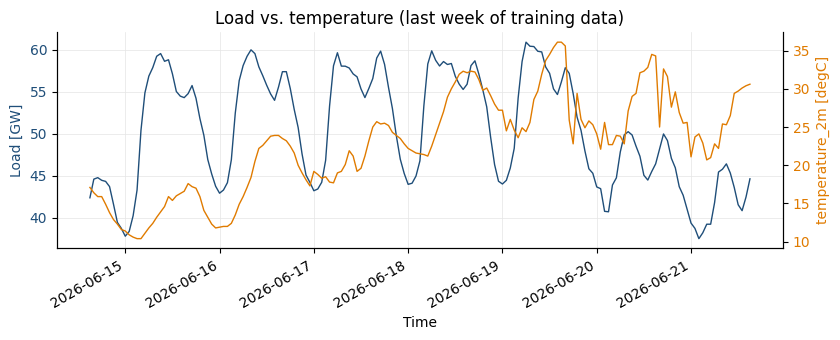

In [32]:
#| label: fig-team4-weather
#| echo: true
#| fig-cap: 'Weekly overlay of temperature and load on twin y-axes: the temperature-like weather column (orange, right axis) against the curated `Actual Load` (blue, left axis). Cold spells lift the load; mild days dampen the midday peak.'
import matplotlib.pyplot as plt

weather = team4_mt.weather_aligned
temp_cols = [c for c in weather.columns if "temp" in c.lower()]
load = team4_mt.df_pipeline["Actual Load"].dropna()

if temp_cols and len(load) > 0:
    temp_col = temp_cols[0]
    end = load.index.max()
    w = slice(end - pd.Timedelta(days=7), end)
    load_w = load.loc[w]
    temp_w = weather.loc[w, temp_col]

    fig, ax_load = plt.subplots(figsize=(8.5, 3.5))
    ax_load.plot(load_w.index, load_w.values / 1000, color="#1F4E79", linewidth=1.0)
    ax_load.set_ylabel("Load [GW]", color="#1F4E79")
    ax_load.tick_params(axis="y", labelcolor="#1F4E79")
    ax_load.set_xlabel("Time")
    ax_load.grid(True, color="#E5E5E5", linewidth=0.5)

    ax_temp = ax_load.twinx()
    ax_temp.plot(temp_w.index, temp_w.values, color="#E07B00", linewidth=1.0)
    ax_temp.set_ylabel(f"{temp_col} [degC]", color="#E07B00")
    ax_temp.tick_params(axis="y", labelcolor="#E07B00")

    ax_load.set_title("Load vs. temperature (last week of training data)")
    for s in ("top",):
        ax_load.spines[s].set_visible(False)
        ax_temp.spines[s].set_visible(False)
    fig.autofmt_xdate()
    fig.tight_layout()
    plt.show()
else:
    print("no temperature-like weather column available; skipping weather plot")

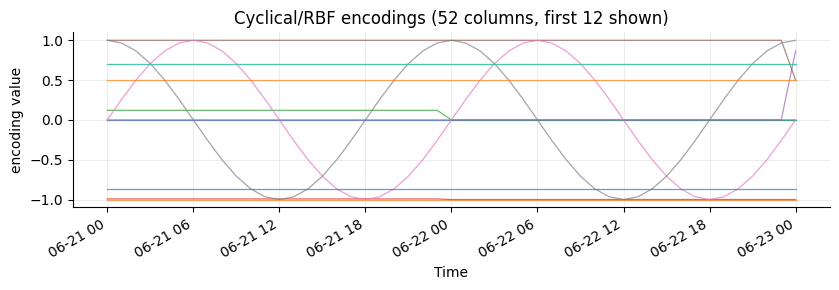

In [33]:
#| label: fig-team4-rbf
#| echo: true
#| fig-cap: Cyclical / radial basis function (RBF) calendar encodings over a two-day window. Each curve is one basis function; together they encode time-of-day and day-of-week position so the model sees cyclic continuity across the midnight and week boundaries.
import matplotlib.pyplot as plt

rbf_cols = [c for c in exog_all.columns
            if any(k in c.lower() for k in ("sin", "cos", "rbf"))]

if rbf_cols:
    end = exog_all.index.max()
    w = slice(end - pd.Timedelta(days=2), end)
    block = exog_all.loc[w, rbf_cols]
    fig, ax = plt.subplots(figsize=(8.5, 3.0))
    for c in rbf_cols[:12]:
        ax.plot(block.index, block[c].values, linewidth=0.9, alpha=0.7)
    ax.set_xlabel("Time")
    ax.set_ylabel("encoding value")
    ax.set_title(f"Cyclical/RBF encodings ({len(rbf_cols)} columns, first 12 shown)")
    ax.grid(True, color="#E5E5E5", linewidth=0.5)
    for s in ("top", "right"):
        ax.spines[s].set_visible(False)
    fig.autofmt_xdate()
    fig.tight_layout()
    plt.show()
else:
    print("no cyclical/RBF columns found; skipping RBF plot")

is_holiday          :  1224 flagged hours
is_brueckentag      :   384 flagged hours
is_before_holiday   :  1104 flagged hours
is_after_holiday    :  1128 flagged hours


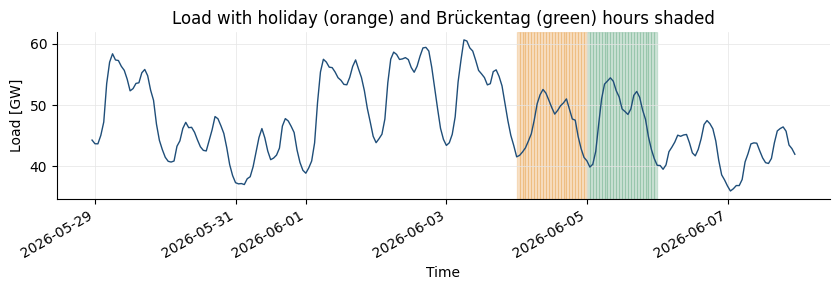

In [34]:
#| label: fig-team4-holidays
#| echo: true
#| fig-cap: 'Holiday and Brückentag indicators over a representative window: the curated `Actual Load` with holiday hours shaded orange and Brückentag hours shaded green. Public holidays shift weekday load downward; bridge days sit between the weekday and holiday levels.'
import matplotlib.pyplot as plt

holiday_cols = [
    c for c in exog_all.columns
    if "holiday" in c.lower() or "brueckentag" in c.lower()
]
load = team4_mt.df_pipeline["Actual Load"].dropna()

if holiday_cols and len(load) > 0:
    # Flagged hours per indicator (is_holiday plus the three adjacency columns).
    for c in holiday_cols:
        print(f"{c:<20s}: {int((exog_all[c] > 0).sum()):>5d} flagged hours")
    hol_col = "is_holiday" if "is_holiday" in holiday_cols else holiday_cols[0]
    hol = exog_all[hol_col]

    # Window around the most recent holiday hour, falling back to the tail.
    recent_hol = hol[hol > 0]
    if not recent_hol.empty:
        center = recent_hol.index.max()
    else:
        center = load.index.max()
    w = slice(center - pd.Timedelta(days=7), center + pd.Timedelta(days=3))
    load_w = load.loc[load.index.isin(load.loc[w].index)]
    hol_w = hol.loc[w]

    fig, ax = plt.subplots(figsize=(8.5, 3.0))
    ax.plot(load_w.index, load_w.values / 1000, color="#1F4E79", linewidth=1.0)
    in_holiday = hol_w[hol_w > 0].index
    for t in in_holiday:
        ax.axvspan(t, t + pd.Timedelta(hours=1), color="#E07B00", alpha=0.2)
    if "is_brueckentag" in exog_all.columns:
        bt_w = exog_all["is_brueckentag"].loc[w]
        for t in bt_w[bt_w > 0].index:
            ax.axvspan(t, t + pd.Timedelta(hours=1), color="#2E8B57", alpha=0.2)
    ax.set_xlabel("Time")
    ax.set_ylabel("Load [GW]")
    ax.set_title("Load with holiday (orange) and Brückentag (green) hours shaded")
    ax.grid(True, color="#E5E5E5", linewidth=0.5)
    for s in ("top", "right"):
        ax.spines[s].set_visible(False)
    fig.autofmt_xdate()
    fig.tight_layout()
    plt.show()
else:
    print("no holiday column found; skipping holiday plot")

poly_* columns generated : 40
poly_* selected (cap = 40): 40
  poly_hour_cos__temperature_2m_window_1D_mean
  poly_hour_cos__temperature_2m_window_1D_max
  poly_hour_cos__temperature_2m_window_1D_min
  poly_hour_cos__relative_humidity_2m_window_1D_mean
  poly_hour_cos__relative_humidity_2m_window_1D_max
  poly_hour_cos__pressure_msl_window_1D_mean
  poly_hour_cos__pressure_msl_window_1D_max
  poly_hour_cos__pressure_msl_window_1D_min
  poly_hour_cos__surface_pressure_window_1D_mean
  poly_hour_cos__surface_pressure_window_1D_max
  poly_hour_cos__surface_pressure_window_1D_min
  poly_hour_cos__cloud_cover_window_1D_max
  poly_hour_cos__wind_direction_10m_window_1D_max
  poly_hour_cos__temperature_2m_window_7D_mean
  poly_hour_cos__temperature_2m_window_7D_max
  poly_hour_cos__temperature_2m_window_7D_min
  poly_hour_cos__relative_humidity_2m_window_7D_mean
  poly_hour_cos__relative_humidity_2m_window_7D_max
  poly_hour_cos__relative_humidity_2m_window_7D_min
  poly_hour_cos__weather_cod

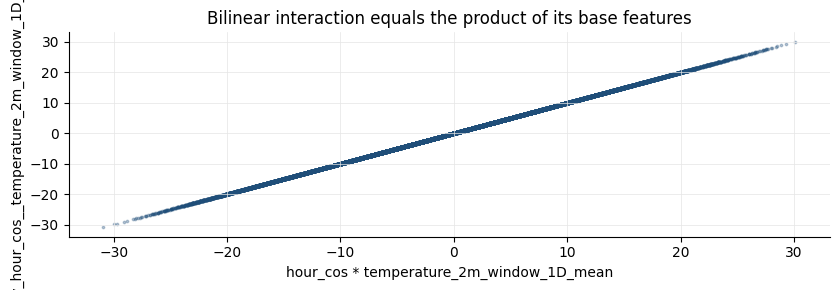


`select_exogenous_features` pruned 174 encoded columns down to the 166 features actually used for training.


In [35]:
#| label: fig-team4-poly
#| echo: true
#| fig-cap: Bilinear polynomial expansion produced by the pipeline at `poly_features_degree=2`. Each `poly_<a>__<b>` column is the elementwise product of two base features; the cap keeps only the `max_poly_features` most informative ones by mutual information. The scatter confirms one such column equals the product of its two bases (correlation ≈ 1).
import matplotlib.pyplot as plt

# With poly_features_degree=2 the pipeline emits poly_<a>__<b> interaction
# columns, then keeps the top max_poly_features by mutual information.
poly_cols = [c for c in exog_all.columns if c.startswith("poly_")]
selected_poly = [c for c in team4_mt.exog_feature_names if c.startswith("poly_")]
print(f"poly_* columns generated : {len(poly_cols)}")
print(f"poly_* selected (cap = {team4_config.max_poly_features}): {len(selected_poly)}")
for c in selected_poly:
    print(f"  {c}")

# Demonstrate that a poly_<a>__<b> column equals the product of its two bases.
demonstrated = False
for poly_col in selected_poly or poly_cols:
    parts = poly_col[len("poly_"):].split("__")
    if len(parts) == 2 and parts[0] in exog_all.columns and parts[1] in exog_all.columns:
        a, b = parts
        product = exog_all[a] * exog_all[b]
        corr = float(exog_all[poly_col].corr(product))
        print(f"{poly_col} == {a} * {b}  (corr = {corr:.4f})")
        fig, ax = plt.subplots(figsize=(8.5, 3.0))
        ax.scatter(product.values, exog_all[poly_col].values, s=3, alpha=0.3, color="#1F4E79")
        ax.set_xlabel(f"{a} * {b}")
        ax.set_ylabel(poly_col)
        ax.set_title("Bilinear interaction equals the product of its base features")
        ax.grid(True, color="#E5E5E5", linewidth=0.5)
        for s in ("top", "right"):
            ax.spines[s].set_visible(False)
        fig.tight_layout()
        plt.show()
        demonstrated = True
        break
if not demonstrated:
    print("no recoverable poly_<a>__<b> column to demonstrate")

print(f"\n`select_exogenous_features` pruned {exog_all.shape[1]} encoded columns "
      f"down to the {len(team4_mt.exog_feature_names)} features actually used for training.")

### Step 5 --- Train with SpotOptim and predict through tomorrow {#sec-team4-run}

With the curated, gap-free target and the selected exogenous matrix in
place, `run_task_spotoptim(search_space=team4_search_space)` executes the
SpotOptim search over the weekly-anchored space from @sec-team4-search-space and
refits the LGBM forecaster. (The generic `run()` dispatcher would fall back
to the package's default search space --- it does not forward a custom one,
which is why the cell calls the task method directly.) The bulk of the time
is the SpotOptim trials against the CV folds; because `n_jobs_spotoptim=-1`
(@sec-team4-config) spreads those trials across all CPU cores, the 100-trial
search completes in a few minutes on a recent multi-core laptop rather than
the tens of minutes a serial run of the same budget would take.

::: {.callout-note title="Reading the SpotOptim progress bars"}
With `show=True` --- as in the training cell below --- SpotOptim prints a
`tqdm` progress bar every time it scores a candidate model --- one bar per
rolling cross-validation back-test; pass `show=False` for a quiet render.
The numbers to the right of a finished bar, e.g.
`70/70 [00:00<00:00, 259.84it/s]`, are `tqdm`'s standard read-out:

- `70/70` --- steps completed out of the total; here all 70 are done (100 %).
- `[00:00<00:00, 259.84it/s]` follows the pattern `[elapsed<remaining, rate]`:
    - the first `00:00` is the wall-clock time already spent on the bar
      (`mm:ss`, or `h:mm:ss` once it passes an hour);
    - the second `00:00` is `tqdm`'s estimate of the time still to go --- zero
      here, because the bar has just finished;
    - `259.84it/s` is the throughput, about 260 iterations per second; below one
      per second `tqdm` switches to its reciprocal `s/it` (seconds per iteration).

A bar caught mid-run, `55/70 [00:00<00:00, 240.00it/s]`, would then read: 55 of
70 steps done, at about 240 steps per second.

The total, `70`, is the number of *folds* in the back-test that scores one
candidate. The search reserves a validation span of
`delta_val = PREDICT_SIZE × REFIT_SIZE × NUMBER_FOLDS = 24 × 7 × 10 = 1680`
hours (70 days, @sec-cross-validation-geometry) and tiles it into blocks of
`cv_block_size` hours. The config sets `cv_block_size = PREDICT_SIZE = 24`,
decoupled from the live `predict_size = LIVE_N_STEPS` (@sec-team4-cutoff), so

$$
F = \frac{\Delta_{\mathrm{val}}}{b}
  = \frac{1680}{24} = 70 .
$$

Because `cv_block_size` is fixed, this total is the *same on every render* --- it
does not drift with the live horizon. One such bar appears for every candidate
the search scores, i.e. `n_trials_spotoptim` times --- the budget already
includes the `n_initial_spotoptim` design points.
@sec-cross-validation-geometry derives this geometry in full and explains why the
CV block is `cv_block_size`, not the live `predict_size`.

Each fold bar is prefixed with a coarse-grained label of the form `config k/N`
--- for instance `config 42/100` --- where `k` counts the candidate
configurations evaluated so far and `N` is the full search budget
`n_trials_spotoptim`. The two granularities are complementary: the inner
`70/70` tracks folds within a single candidate and resets to `0/70` at every
new `config`, while `config k/N` advances once per candidate and reaches `N`
when the search finishes.

These bars (and their `config k/N` prefix) are progress reporting only; they
do not affect the result, and `show=False` --- used in @sec-live-submission
--- suppresses them entirely.
:::

In [36]:
#| label: team4-train
#| echo: true
team4_mt.run_task_spotoptim(search_space=team4_search_space, show=False)

future = team4_mt.results["spotoptim"]["Actual Load"]["future_pred"]
print(f"raw forecast: {len(future)} hourly steps "
      f"| {future.index.min()} → {future.index.max()}")

y0 = future.loc[TOMORROW_UTC:LAST_TARGET]
print(f"y_0 slice   : {len(y0)} hourly steps "
      f"| {y0.index.min()} → {y0.index.max()}")

INFO:spotforecast2_safe.multitask.base.MultiTask:[task 4] Target 'Actual Load': task 4: SpotOptim Tuned ...
INFO:spotforecast2_safe.multitask.base.MultiTask:  Warm-start lags seeded: [1, 2, 3, 15, 24, 25, 168, 169]


config 1/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 2/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 3/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 4/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 5/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 6/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 7/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 8/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 9/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 10/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 11/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 12/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 13/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 14/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 15/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 16/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 17/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 18/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 19/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 20/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 21/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 22/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 23/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 24/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 25/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 26/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 27/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 28/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 29/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 30/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 31/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 32/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 33/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 34/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 35/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 36/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 37/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 38/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 39/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 40/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 41/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 42/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 43/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 44/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 45/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 46/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 47/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 48/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 49/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 50/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 51/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 52/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 53/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 54/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 55/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 56/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 57/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 58/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 59/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 60/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 61/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 62/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 63/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 64/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 65/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 66/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 67/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 68/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 69/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 70/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 71/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 72/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 73/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 74/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 75/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 76/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 77/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 78/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 79/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 80/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 81/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 82/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 83/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 84/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 85/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 86/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 87/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 88/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 89/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 90/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 91/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 92/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 93/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 94/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 95/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 96/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 97/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 98/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 99/100:   0%|          | 0/70 [00:00<?, ?it/s]

config 100/100:   0%|          | 0/70 [00:00<?, ?it/s]

INFO:spotforecast2_safe.multitask.base.MultiTask:  Best params: {'estimator__num_leaves': 484, 'estimator__max_depth': 24, 'estimator__learning_rate': 0.0460035443565324, 'estimator__n_estimators': 1744, 'estimator__bagging_fraction': 0.5068240195415998, 'estimator__feature_fraction': 0.549442160948004, 'estimator__reg_alpha': 1.2543711748271986, 'estimator__reg_lambda': 8.3327967686361}
INFO:spotforecast2_safe.multitask.base.MultiTask:  Best lags: [  1   2   3  23  24  25  47  48 167 168 169 336]
INFO:spotforecast2_safe.multitask.base.MultiTask:  Saved tuning results: D:\spotforecast2_cache\ddmo_ch14_team4\tuning_results\ddmo-live-team4_Actual Load_spotoptim_20260621_165446.json


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [  1   2   3  23  24  25  47  48 167 168 169 336] 
  Parameters: {'estimator__num_leaves': 484, 'estimator__max_depth': 24, 'estimator__learning_rate': 0.0460035443565324, 'estimator__n_estimators': 1744, 'estimator__bagging_fraction': 0.5068240195415998, 'estimator__feature_fraction': 0.549442160948004, 'estimator__reg_alpha': 1.2543711748271986, 'estimator__reg_lambda': 8.3327967686361}
  Backtesting metric: 1314.0312795645248


INFO:spotforecast2_safe.multitask.base.MultiTask:  Saved model: D:\spotforecast2_cache\ddmo_ch14_team4\models\ddmo-live-team4\ddmo-live-team4_Actual Load_spotoptim_20260621_165512.joblib


raw forecast: 33 hourly steps | 2026-06-21 15:00:00+00:00 → 2026-06-22 23:00:00+00:00
y_0 slice   : 24 hourly steps | 2026-06-22 00:00:00+00:00 → 2026-06-22 23:00:00+00:00


### Step 6 --- Feature importance and SHAP {#sec-team4-importance}

The fitted forecaster lives in the results dict. We reconstruct its
training design matrix --- lags plus selected exogenous features --- and
read two complementary attributions: LightGBM's split-count importance
and SHapley Additive exPlanations (SHAP). Both answer the Art. 13
transparency question *what does the model base its forecast on?* The cell
also runs the chapter's data-governance check. team_4 now *uses* ENTSO-E's
day-ahead priors as features (`entsoe_forecasted_load` and the other
provider columns), which is admissible because each is published `D-1` and
is therefore available at forecast time. The invariant the check enforces
is the complementary one: no *realised* quantity for the target day --- the
raw interim `Actual Load` / `Forecasted Load` columns or the legacy realised
`Actual` --- may reach the model. The model sees only the aligned day-ahead
provider copies and the lagged history.

In [37]:
#| label: team4-load-model
#| echo: true
fc = team4_mt.results["spotoptim"]["Actual Load"]["forecaster"]

X_tr, y_int = fc.create_train_X_y(
    y=team4_mt.data_with_exog["Actual Load"],
    exog=team4_mt.data_with_exog[team4_mt.exog_feature_names],
)
assert list(X_tr.columns) == list(fc.estimator.feature_name_), \
    "design-matrix columns do not match the fitted estimator's feature names"

feat_names = list(fc.estimator.feature_name_)
print(f"trained features: {len(feat_names)}")

# Data-governance check (CR-3). team_4 now *uses* ENTSO-E's day-ahead priors
# as features --- the provider columns `entsoe_forecasted_load`,
# `entsoe_wind_forecast`, `entsoe_solar_forecast`, `entsoe_net_load`,
# `entsoe_day_ahead_price` (plus the static `covid_infection_rate`). Those are
# admissible: each is published on D-1 (or, for COVID, a static vintage), so it
# is available at forecast time and cannot leak the target day. What must NEVER
# enter the model is a *realised* quantity --- the raw interim `Actual Load` /
# `Forecasted Load` columns (the model sees only the aligned day-ahead provider
# copies and the lagged history) or the legacy realised `Actual`. Assert that,
# fail-loud, so a future regression breaks the render rather than biasing the
# model.
RAW_INTERIM_COLS = {"Actual Load", "Forecasted Load", "Actual"}
assert not (RAW_INTERIM_COLS & set(team4_mt.exog_feature_names)), \
    "a raw interim column leaked into the selected exogenous features!"
assert not (RAW_INTERIM_COLS & set(feat_names)), \
    "a raw interim column leaked into the fitted model's features!"

# The day-ahead / static priors the model is allowed to use (report-only: with
# on_exog_provider_failure='skip' a provider whose side-table is still gappy on
# the validated window after bounded healing is dropped, so this set lists the
# ones that actually made it in).
day_ahead_priors = sorted(
    c for c in feat_names if c.startswith("entsoe_") or c == "covid_infection_rate"
)
print(f"day-ahead / static priors used as features: {day_ahead_priors}")
print("data-governance check passed: priors are day-ahead/static; "
      "no realised target-day column reached the model")

fam_counts = {}
for col in feat_names:
    fam_counts[family_of(col)] = fam_counts.get(family_of(col), 0) + 1
for fam, n in sorted(fam_counts.items(), key=lambda kv: kv[1], reverse=True):
    print(f"  {fam:<16}: {n}")

trained features: 181
day-ahead / static priors used as features: ['covid_infection_rate', 'entsoe_day_ahead_price', 'entsoe_net_load', 'entsoe_solar_forecast', 'entsoe_wind_forecast']
data-governance check passed: priors are day-ahead/static; no realised target-day column reached the model
  weather_window  : 90
  polynomial      : 40
  weather/other   : 18
  lag             : 12
  cyclical/RBF    : 12
  holiday         : 4
  entsoe_provider : 4
  covid           : 1


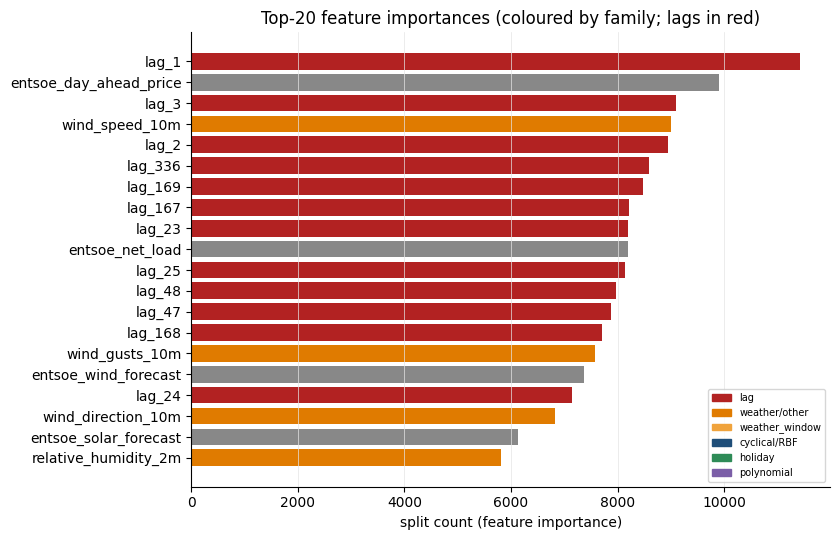

In [38]:
#| label: fig-team4-importance
#| echo: true
#| fig-cap: Top-20 LightGBM split-count feature importances of the tuned forecaster, coloured by feature family. Lag features (highlighted) carry the bulk of the information; weather, calendar, holiday, and polynomial features supplement them.
import matplotlib.pyplot as plt

importances = fc.estimator.feature_importances_
ranking = sorted(zip(feat_names, importances), key=lambda kv: kv[1], reverse=True)[:20]

family_color = {
    "lag":            "#B22222",
    "weather/other":  "#E07B00",
    "weather_window": "#F0A33C",
    "cyclical/RBF":   "#1F4E79",
    "holiday":        "#2E8B57",
    "polynomial":     "#7B5EA7",
}

labels = [n for n, _ in ranking][::-1]
values = [v for _, v in ranking][::-1]
colors = [family_color.get(family_of(n), "#888888") for n in labels]

fig, ax = plt.subplots(figsize=(8.5, 5.5))
ax.barh(labels, values, color=colors)
ax.set_xlabel("split count (feature importance)")
ax.set_title("Top-20 feature importances (coloured by family; lags in red)")
ax.grid(True, axis="x", color="#E5E5E5", linewidth=0.5)
handles = [plt.Rectangle((0, 0), 1, 1, color=c) for c in family_color.values()]
ax.legend(handles, family_color.keys(), fontsize=7, loc="lower right")
for s in ("top", "right"):
    ax.spines[s].set_visible(False)
fig.tight_layout()
plt.show()

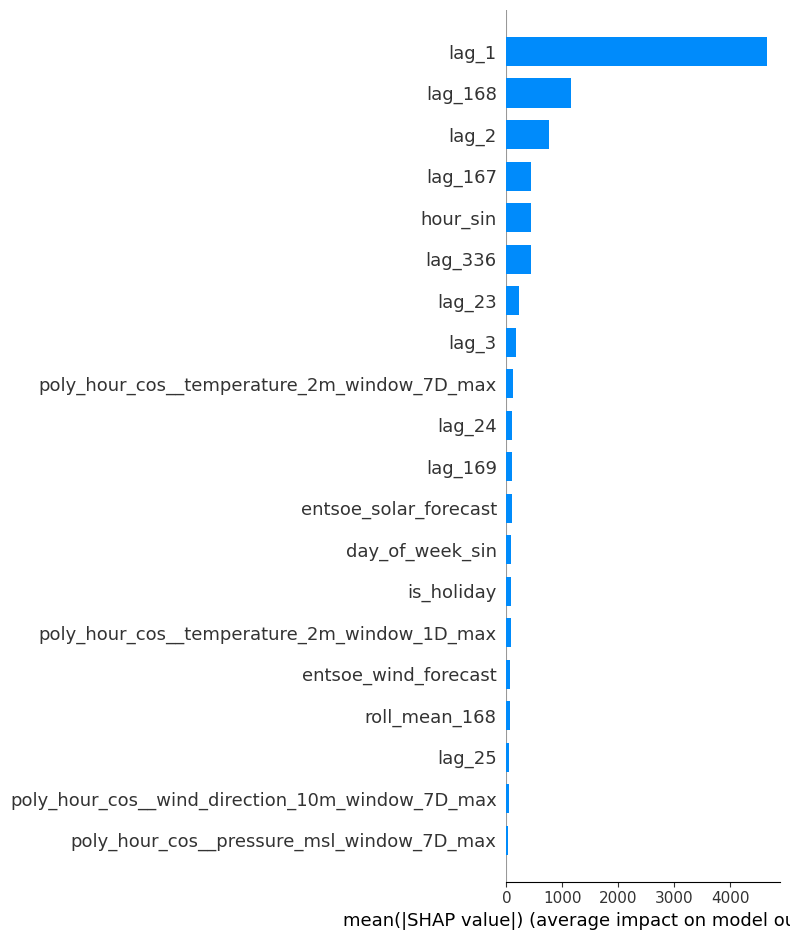

In [39]:
#| label: fig-team4-shap
#| echo: true
#| fig-cap: Mean absolute SHapley Additive exPlanations (SHAP) value per feature over a ≈2000-row deterministic sample of the training design matrix. SHAP measures each feature's average contribution to the prediction, complementing the split-count ranking above.
import shap
import matplotlib.pyplot as plt

step = max(1, len(X_tr) // 2000)
X_sample = X_tr.iloc[::step]

explainer = shap.TreeExplainer(fc.estimator)
sv = explainer.shap_values(X_sample)

shap.summary_plot(sv, X_sample, plot_type="bar", show=False)
plt.tight_layout()
plt.show()

Split-count importance ranks features by how often LightGBM branches on
them, while mean absolute SHAP ranks them by their average effect on the
forecast --- the two orderings can disagree, and reporting both is the
kind of layered explanation Art. 13 transparency expects.

### Visual inspection

`make_plot` (its `PredictionFigure` builder) already knows how to draw a
benchmark line: whenever the prediction package carries a `future_forecast`
Series, the figure adds a "Benchmark Forecast (e.g., ENTSOE)" trace for free.
So overlaying ENTSO-E's own day-ahead forecast is a one-liner --- assign
`predictions_entsoe` (@sec-team4-entsoe-predictions) to that key before
calling `make_plot`, rather than appending a Plotly trace by hand. The series
must be in raw MW (the same units `future_pred` uses) and is reindexed onto the
forecast horizon so it lines up hour-for-hour. The benchmark legend also reads
optional `metrics_forecast` / `metrics_forecast_one_day` entries; we leave them
unset --- the target day is not yet scorable (@sec-team4-vs-entsoe) --- so those
MAE/MAPE figures render as zero placeholders until the actuals arrive.

In [40]:
#| label: fig-team4-predict
#| echo: true
#| fig-cap: team_4 live ENTSO-E DE load forecast --- advanced setup (6 SpotOptim trials, 5 seasonal periods, weather windows, holiday and polynomial features). Training fit left of the dashed line; recursive forecast through tomorrow 23:00 UTC right of it. The 24 hourly values for `y_0` are the rightmost block. The benchmark trace is ENTSO-E's own day-ahead `Forecasted Load`, which team_4 now also uses as the `entsoe_forecasted_load` feature (@sec-team4-exog) --- here it doubles as the day-ahead prior the model corrects (@sec-team4-vs-entsoe).
from spotforecast2.plots.plotter import make_plot

pkg = team4_mt.results["spotoptim"]["Actual Load"]

# Built-in benchmark trace: PredictionFigure draws a "Benchmark Forecast" line
# whenever the package carries a `future_forecast` Series (raw MW, like
# `future_pred`). Reuse predictions_entsoe, reindexed onto the forecast horizon.
pkg["future_forecast"] = predictions_entsoe.reindex(pkg["future_pred"].index)

print("future_pred     :", len(pkg["future_pred"]), "rows,",
      pkg["future_pred"].index.min(), "→", pkg["future_pred"].index.max())
print("future_forecast :", int(pkg["future_forecast"].notna().sum()),
      "of", len(pkg["future_forecast"]), "ENTSO-E hours populated")
print("metrics_future         :", pkg.get("metrics_future"))
print("metrics_future_one_day :", pkg.get("metrics_future_one_day"))

fig = make_plot(pkg)
fig.show()

future_pred     : 33 rows, 2026-06-21 15:00:00+00:00 → 2026-06-22 23:00:00+00:00
future_forecast : 31 of 33 ENTSO-E hours populated
metrics_future         : {'mae': 46.6155434741886, 'mape': 0.0010482474010196279}
metrics_future_one_day : {'mae': 46.6155434741886, 'mape': 0.0010482474010196279}


### ENTSO-E's own day-ahead forecast vs. ours {#sec-team4-vs-entsoe}

ENTSO-E publishes a day-ahead `Forecasted Load` alongside the actuals
(@sec-team4-prepare). team_4 now *feeds* it to the model as the
`entsoe_forecasted_load` feature (@sec-team4-exog), so this is no longer a
model-vs-independent-baseline comparison but a *value-added* one: how far
team_4's forecast moves away from the day-ahead number it was handed. Because
the day-ahead forecast is published `D-1`, using it as an input is leakage-clean
(CR-3); the transmission system operators' prediction becomes a near-oracle
prior the model is free to correct. The cell below restricts
`predictions_entsoe` (@sec-team4-entsoe-predictions) to `y_0`'s window and
overlays it on `team_4`'s forecast.
Neither curve can be scored yet (the target day's actuals are not observed),
so this is a forecast-vs-forecast comparison; the printed mean absolute
difference quantifies how far the two disagree. The day-ahead forecast reaches
the interim file because the download in @sec-team4-download passes
`keep_forecast_future=True` (without it, `download_new_data` drops every future
row). It is published around midday `D-1`, so a render before that window --- or
the last UTC hours of the target day, which fall into the next local publication
day --- may leave a few target hours uncovered; the cell handles that gracefully
and draws only the hours ENTSO-E has actually published.

ENTSO-E day-ahead hours available on target day: 22 / 24
mean |team_4 - ENTSO-E| over the overlap: 1,785 MW


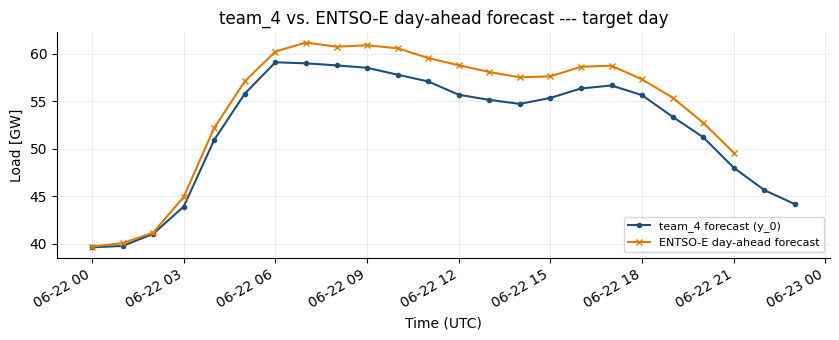

In [41]:
#| label: fig-team4-vs-entsoe
#| echo: true
#| fig-cap: ENTSO-E's published day-ahead Forecasted Load for the target day (orange) vs. team_4's forecast `y_0` (blue), on the same 24 hourly steps. Neither is scored --- the target day's actuals are not yet observed --- so this contrasts two forecasts, not forecast against truth.
import matplotlib.pyplot as plt

# Reuse predictions_entsoe (@sec-team4-entsoe-predictions) --- already on the
# hourly grid --- restricted to y_0's 24-hour window.
entsoe_fc = predictions_entsoe.reindex(y0.index)
overlap = entsoe_fc.dropna().index
print(f"ENTSO-E day-ahead hours available on target day: {len(overlap)} / {len(y0)}")
if len(overlap) > 0:
    mad = float((y0.loc[overlap] - entsoe_fc.loc[overlap]).abs().mean())
    print(f"mean |team_4 - ENTSO-E| over the overlap: {mad:,.0f} MW")
else:
    print("ENTSO-E has not published a day-ahead forecast for the target day "
          "in the local cache yet; showing team_4 only.")

fig, ax = plt.subplots(figsize=(8.5, 3.5))
ax.plot(y0.index, y0.values / 1000, marker="o", ms=3, color="#1F4E79",
        label="team_4 forecast (y_0)")
if len(overlap) > 0:
    ax.plot(entsoe_fc.index, entsoe_fc.values / 1000, marker="x", ms=4,
            color="#E07B00", label="ENTSO-E day-ahead forecast")
ax.set_xlabel("Time (UTC)")
ax.set_ylabel("Load [GW]")
ax.set_title("team_4 vs. ENTSO-E day-ahead forecast --- target day")
ax.grid(True, color="#E5E5E5", linewidth=0.5)
ax.legend(fontsize=8)
for s in ("top", "right"):
    ax.spines[s].set_visible(False)
fig.autofmt_xdate()
fig.tight_layout()
plt.show()

### Shape plausibility check {#sec-team4-shape-check}

The contract assertions below verify the submission's *form* (row count,
positivity, timestamps) but say nothing about whether the forecast looks like
a day of German load. The 2026-06-05 incident (@sec-team4-factory) showed why
that matters: a structurally flat forecast --- daily range 4.7 GW, Pearson
correlation with ENTSO-E's day-ahead profile below zero --- passed every
formal contract and shipped. The check below compares `y_0` against the
published day-ahead profile on two simple statistics: the Pearson correlation
$r$ (do the curves rise and fall together?) and the ratio of daily ranges
(does the forecast carry comparable amplitude?). If ENTSO-E's forecast is not
yet in the local cache, the same weekday one week earlier serves as the
reference profile.

The check *warns* rather than aborts: ENTSO-E's forecast is itself a
prediction, and a genuinely unusual day (a strike, an extreme-weather event)
could legitimately disagree with it. Blocking the submission on a heuristic
would automate away exactly the judgement Art. 14 (human oversight) wants a
person to exercise; the loud warning puts the decision where it belongs ---
with the operator reading the render before the PR is pushed.

In [42]:
#| label: team4-shape-check
#| echo: true
SHAPE_MIN_CORR = 0.6     # profile agreement: curves rise and fall together
SHAPE_MIN_RANGE = 0.5    # amplitude: forecast range >= half the reference range

reference, ref_name = entsoe_fc.dropna(), "ENTSO-E day-ahead"
if len(reference) < 12:  # fallback: same weekday one week earlier
    week_ago = interim["Actual Load"].resample("h").mean().reindex(
        y0.index - pd.Timedelta(hours=168))
    week_ago.index = week_ago.index + pd.Timedelta(hours=168)
    reference, ref_name = week_ago.dropna(), "actuals one week earlier"

if len(reference) < 12:
    print("shape check skipped: no reference profile available in the cache.")
else:
    common = y0.index.intersection(reference.index)
    r = float(y0.loc[common].corr(reference.loc[common]))
    ref_range = float(reference.loc[common].max() - reference.loc[common].min())
    range_ratio = float((y0.max() - y0.min()) / ref_range) if ref_range > 0 else float("nan")
    print(f"shape check vs. {ref_name} ({len(common)} h): "
          f"r = {r:.2f} (min {SHAPE_MIN_CORR}), "
          f"range ratio = {range_ratio:.2f} (min {SHAPE_MIN_RANGE})")
    if r < SHAPE_MIN_CORR or range_ratio < SHAPE_MIN_RANGE:
        print("=" * 72)
        print("WARNING: forecast shape implausible -- the daily profile does not")
        print(f"track the {ref_name} reference. Inspect @sec-team4-vs-entsoe")
        print("before pushing this submission (warn-only by design, Art. 14).")
        print("=" * 72)
    else:
        print("shape check passed: daily profile and amplitude look plausible.")

shape check vs. ENTSO-E day-ahead (22 h): r = 1.00 (min 0.6), range ratio = 0.91 (min 0.5)
shape check passed: daily profile and amplitude look plausible.


### Validate the schema and write the submission CSV {#sec-team4-write}

Same four contract assertions as @sec-live-example: 24 rows, first
stamp `TOMORROW 00:00 UTC`, every value strictly positive, no NaN. The
write target is `submissions/<TEAM_ID>/<tomorrow>.csv` inside the
leaderboard fork, where `TEAM_ID` is *derived from the configuration*
rather than hardcoded: a model that consumes ENTSO-E's day-ahead
`Forecasted Load` as a feature (`include_entsoe_forecast_load=True`,
@sec-team4-config) competes under `team_4_entsoe`, while the same
pipeline with that single feature switched off competes under `team_4`.
Binding the identity to the flag keeps the two model classes separable
on the leaderboard --- a with-prior forecast can never be scored under
the without-prior name or vice versa.

In [43]:
#| label: team4-submission-write
#| echo: true
assert len(y0) == 24,           f"expected 24 hourly steps for y_0, got {len(y0)}"
assert y0.index.min() == TOMORROW_UTC, (
    f"first step {y0.index.min()} != TOMORROW {TOMORROW_UTC}"
)
assert (y0 > 0).all(),          "non-positive forecast value --- spec requires > 0"
assert y0.notna().all(),        "NaN in forecast --- spec forbids"

TEAM_ID = "a_team_entsoe" if team4_config.include_entsoe_forecast_load else "a_team"
print(f"TEAM_ID = {TEAM_ID}  "
      f"(include_entsoe_forecast_load={team4_config.include_entsoe_forecast_load})")

LEADERBOARD_DIR = Path(r"D:\workspace\challenge-leaderboard")
SUBMISSION_DIR = LEADERBOARD_DIR / "submissions" / TEAM_ID
SUBMISSION_DIR.mkdir(parents=True, exist_ok=True)
submission_path = SUBMISSION_DIR / f"{TOMORROW_UTC.date().isoformat()}.csv"

submission_df = pd.DataFrame({
    "timestamp_utc": y0.index.strftime("%Y-%m-%dT%H:%M:%SZ"),
    "forecast_mw":   y0.round(2).values,
})
submission_df.to_csv(submission_path, index=False)

# relative path for the validator (forward slashes)
relative_path = submission_path.relative_to(LEADERBOARD_DIR).as_posix()
print(f"wrote {submission_path}")
print(f"  validator path: {relative_path}")
print(f"  rows: {len(submission_df)}")
print(f"  range: {submission_df.forecast_mw.min():.1f}–{submission_df.forecast_mw.max():.1f} MW")
submission_df.head(3)

TEAM_ID = a_team  (include_entsoe_forecast_load=False)
wrote D:\workspace\challenge-leaderboard\submissions\a_team\2026-06-22.csv
  validator path: submissions/a_team/2026-06-22.csv
  rows: 24
  range: 39617.2–59088.9 MW


,timestamp_utc,forecast_mw
0,2026-06-22T00:00:00Z,39617.19
1,2026-06-22T01:00:00Z,39758.31
2,2026-06-22T02:00:00Z,41027.23


### Local validation with the leaderboard's own script

In [44]:
#| label: team4-validate
#| echo: true
import subprocess
lb_repo = Path(r"D:\workspace\challenge-leaderboard")
result = subprocess.run(
    [
        "uv", "run", "python", "scripts/validate_submission.py",
        "--path", submission_path.relative_to(lb_repo).as_posix(),
        "--skip-deadline",
    ],
    cwd=lb_repo,
    capture_output=True,
    text=True,
)
print("exit code:", result.returncode)
print("stdout   :", result.stdout.strip())
if result.stderr.strip():
    print("stderr   :", result.stderr.strip())

exit code: 0
stdout   : OK: team=a_team target_date=2026-06-22 file=submissions/a_team/2026-06-22.csv
stderr   : warning: `VIRTUAL_ENV=D:\workspace\.venv` does not match the project environment path `.venv` and will be ignored; use `--active` to target the active environment instead


## Commit and push the submission PR {#sec-team4-push}

The cells above only *write* the CSV --- they deliberately do not
commit, push, or open the PR (a careless render must not be able to
spam the leaderboard). Run the block below from a shell once the
validation cell above is green:

```bash
cd ~/workspace/challenge-leaderboard
# TARGET=$(date -u -d 'tomorrow' +%F)                # Linux equivalent
TARGET=$(date -u -v+1d +%F)
# Must match the TEAM_ID the render printed (@sec-team4-write):
# team_4_entsoe when include_entsoe_forecast_load=True, team_4 otherwise.
TEAM_ID=a_team
# Unique branch per attempt: re-submitting for the same target day must not
# collide with an earlier (already-merged) branch of the same name.
BRANCH="submission/${TEAM_ID}-${TARGET}-$(date -u +%H%M%S)"
git switch -c "$BRANCH" main
git add "submissions/${TEAM_ID}/${TARGET}.csv"
git commit -m "submission(${TEAM_ID}): forecast for ${TARGET}"
git push -u origin "$BRANCH"

gh pr create --base main --repo bartzbeielstein/challenge-leaderboard \
    --head "$BRANCH" \
    --title "submission(${TEAM_ID}): forecast for ${TARGET}" \
    --body  "Generated by ddmo-sose-26 chapter 14 (${TEAM_ID} advanced submission)."
```

If validation on the PR passes, auto-merge squashes the submission
onto `main`. The next morning at 07:00 UTC the leaderboard's
`score-daily.yml` cron (see @sec-live-cron) scores it against ENTSO-E
final actuals.

::: {.callout-warning title="Deadline"}
Submissions for target day `D` must be merged before `D-1 23:59 UTC`
--- the validator enforces this strictly. The advanced configuration
in this chapter renders in 10--20 minutes on a typical laptop (the
100-trial search and the long rolling window features both add to the
per-trial cost); give yourself at least 45 minutes of head-room before
the deadline.
:::

## What changed vs. chapter 13 --- summary {#sec-team4-summary}

| Knob | @sec-live-submission | This chapter |
|:--|:--|:--|
| `periods` | `daily` only | `daily, weekly, monthly, quarterly, yearly` |
| `lags_consider` | `[1, 2, 24]` | data-selected via PACF (@sec-team4-lags) |
| `warm_start_lags` | `False` (default) | `True` |
| `forecaster_factory` | stock (one 72-h mean) | `team4_lgbm_factory`: anchored means 72/168/720 h (@sec-team4-factory) |
| SpotOptim search space | package default (6 lag candidates, 4 anchor-free) | weekly-anchored pool; linear `n_estimators` range (@sec-team4-search-space) |
| Training cutoff | last published hour | last *complete* hour (@sec-team4-cutoff) |
| Value-sanity QC | none | implausible 15-min actuals detected and cut away (range > 8 GW, step > 6 GW; @sec-team4-cutoff) |
| `target_corruption_policy` | (off) | `"truncate"` via `target_qc_*` knobs --- retract to last sound hour + extended bridge; `"abort"` = conservative alternative (@sec-team4-config) |
| Shape check | none | warn-only vs. ENTSO-E day-ahead (@sec-team4-shape-check) |
| `train_size` | 3 years | 2 years |
| `include_weather_windows` | (default) | `True` |
| `include_holiday_features` | (default) | `True` |
| `include_holiday_adjacency_features` | (default) | `True` |
| `poly_features_degree` | `1` (off) | `2` |
| `max_poly_features` | `10` | `40` |
| `n_trials_spotoptim` | `10` | `100` |
| `n_initial_spotoptim` | `5` | `50` |
| `n_jobs_spotoptim` | `None` (serial) | `-1` (all cores) |
| `number_folds` | `10` | `10` |
| Team id | `<team_id>` placeholder | derived from `include_entsoe_forecast_load`: `team_4_entsoe` / `team_4` (@sec-team4-identity) |

::: {.callout-tip title="Exercises (with Claude)"}
1. *Did the bigger budget pay off?* Compare `metrics_future_one_day`
   from this chapter against the same metric in @sec-live-example for
   the same target day. Discuss with Claude whether the gain (or
   loss) justifies the extra ~5 minutes of compute.
2. *Ablate a feature.* Set `poly_features_degree=1` (interactions off) and
   re-render only the train + write cells. Does the MAE move noticeably? If
   not, the interactions are not load-bearing for this dataset.
3. *Inspect the tuned hyperparameters.* Print
   `team4_mt.results["spotoptim"]["Actual Load"]` keys and locate the
   best-trial summary. Which lag configuration did SpotOptim pick --- the
   warm-started `key_lags`, one of the package's six stock candidates, or
   one of the extended candidates from @sec-team4-search-space?
4. *How much does the CV block matter?* This chapter fixes the CV block at
   `cv_block_size=24`, decoupled from the live `predict_size=LIVE_N_STEPS`
   (@sec-cross-validation-geometry). Re-run the train cell with
   `cv_block_size=LIVE_N_STEPS` instead --- re-coupling the two --- and compare the
   tuned hyperparameters and `metrics_future_one_day`, and watch the progress-bar
   total change from `70` to `⌈1680/LIVE_N_STEPS⌉`. Discuss with Claude why a
   recursive forecaster's CV score depends on the block length, and whether the
   fixed 24-hour block or the longer live horizon better matches the
   leaderboard's 24-hour metric.
5. *Reproduce the flat-forecast incident.* Re-add
   `objective="regression_l1"` and the three 24-hour window features
   (`mean`, `min`, `max`) to `team4_lgbm_factory` (@sec-team4-factory), re-run
   the train cell, and compare the resulting `y_0` and the shape check
   (@sec-team4-shape-check) against the corrected configuration. Then explain
   why the 70-fold back-test cannot detect the failure: what do the folds'
   window features and lag inputs see that the live recursion does not?
:::